# Info
Purpose:

    MODACAERO project. To look at the results from the improved above cloud aod retrievals from MODIS during ORACLES
    Compares to 4STAR and HSRL over the same region as MODIS

Input:

    None

Output:

    Figure and save files

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - write_utils
    - path_utils
    - hdf5storage
    - scipy

Needed Files:
  - MODACAERO updated retrieval files
  - 4STAR ORACLES netcdf
  - HSRL AOD retrievals for ORACLES

Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2023-08-11
    Modified:


# Prepare python environment

In [1]:
import numpy as np
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os
import pandas as pd
from datetime import datetime, timedelta
import pickle
from tqdm.notebook import tqdm 
import warnings
import map_utils as mu
import plotting_utils as pu

In [2]:
name = 'ACAERO'
vv = 'v1'
fp = getpath(name)


Return path named:  ACAERO /data2/ACAERO/


# Load files

## Load 4STAR ORACLES

In [3]:
fps = getpath('sunsat')

Return path named:  sunsat /data/sunsat/


In [4]:
fpo = getpath('ORACLES')

Return path named:  ORACLES /data/sam/ORACLES/


### 2016

In [5]:
ar6 = hs.loadmat(fpo+'/aod_ict/R4/all_aod_ict_R4_2016.mat')

In [6]:
ar6['flac'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)
ar6['flacr'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)&(ar6['fl_routine'])
ar6['flaco'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)&~(ar6['fl_routine'])
ar6['flr'] = (ar6['qual_flag']==0) & (ar6['fl_routine'])
ar6['flo'] = (ar6['qual_flag']==0) & ~(ar6['fl_routine'])
ar6['fl'] = (ar6['qual_flag']==0)

### 2017

In [7]:
ar7 = hs.loadmat(fpo+'/aod_ict_2017/R1/all_aod_ict_R1_2017.mat')

In [8]:
ar7['flac'] = (ar7['qual_flag']==0)&(ar7['flag_acaod']==1)
ar7['flacr'] = (ar7['qual_flag']==0)&(ar7['flag_acaod']==1)&(ar7['fl_routine'])
ar7['flaco'] = (ar7['qual_flag']==0)&(ar7['flag_acaod']==1)&~(ar7['fl_routine'])
ar7['flr'] = (ar7['qual_flag']==0) & (ar7['fl_routine'])
ar7['flo'] = (ar7['qual_flag']==0) & ~(ar7['fl_routine'])
ar7['fl'] = (ar7['qual_flag']==0)

### 2018

In [9]:
ar8 = hs.loadmat(fpo+'/aod_ict_2018/{vv}/all_aod_ict_{vv}_2018.mat'.format(vv='R1'))

In [10]:
ar8['flac'] = (ar8['qual_flag']==0) & (ar8['flag_acaod']==1)  
ar8['flacr'] = (ar8['qual_flag']==0) & (ar8['flag_acaod']==1)&(ar8['fl_routine']) 
ar8['flaco'] = (ar8['qual_flag']==0) & (ar8['flag_acaod']==1)&~(ar8['fl_routine']) 
ar8['flr'] = (ar8['qual_flag']==0) & (ar8['fl_routine'])
ar8['flo'] = (ar8['qual_flag']==0) & (ar8['fl_routine']==False)
ar8['fl'] = (ar8['qual_flag']==0)

### Combined and set days

In [11]:
days6 = ['20160824','20160825','20160827','20160830','20160831','20160902','20160904','20160906','20160908',
       '20160910','20160912','20160914','20160918','20160920','20160924','20160925','20160927','20160930']
days7 = ['20170801','20170802','20170807','20170809', '20170812','20170813','20170815','20170817','20170818','20170819','20170821',
        '20170824','20170826','20170828','20170830','20170831','20170902','20170903','20170904']
days8 = ['20180921','20180922','20180924','20180927','20180930','20181002','20181003','20181005','20181007','20181010','20181012',
        '20181015','20181017','20181019','20181021','20181023','20181025','20181026','20181027']

In [12]:
ar6['daysd'] = [days6[i] for i in ar6['days'].astype(int)]
ar7['daysd'] = [days7[i] for i in ar7['days'].astype(int)]
ar8['daysd'] = [days8[i] for i in ar8['days'].astype(int)]

In [13]:
ar6['ndtime2'] = np.array([datetime(2016,int(d[4:6]),int(d[6:8]),int(ar6['Start_UTC'][i]),
                          int((ar6['Start_UTC'][i]-float(int(ar6['Start_UTC'][i])))*60)) for i,d in enumerate(ar6['daysd'])])
ar7['ndtime2'] = np.array([datetime(2017,int(d[4:6]),int(d[6:8]),int(ar7['Start_UTC'][i]),
                          int((ar7['Start_UTC'][i]-float(int(ar7['Start_UTC'][i])))*60)) for i,d in enumerate(ar7['daysd'])])
ar8['ndtime2'] = np.array([datetime(2018,int(d[4:6]),int(d[6:8]),int(ar8['Start_UTC'][i]),
                          int((ar8['Start_UTC'][i]-float(int(ar8['Start_UTC'][i])))*60)) for i,d in enumerate(ar8['daysd'])])

## Load HSRL ORACLES

### 2016

In [14]:
vv_2016 = 'R9'

In [15]:
fp6 = fpo+'data_other/HSRL/{vv}/'.format(vv=vv_2016)
f6_hsrl = os.listdir(fp6)
f6_hsrl = [ff for ff in f6_hsrl if (vv_2016 in ff) & ff.endswith('h5') ]
f6_hsrl.sort()
f6_hsrl

['HSRL2_ER2_20160819_R9.h5',
 'HSRL2_ER2_20160823_R9.h5',
 'HSRL2_ER2_20160912_R9.h5',
 'HSRL2_ER2_20160916_R9.h5',
 'HSRL2_ER2_20160918_R9.h5',
 'HSRL2_ER2_20160920_R9.h5',
 'HSRL2_ER2_20160922_R9.h5',
 'HSRL2_ER2_20160924_R9.h5']

In [16]:
hsrl_days6 = [f.split('_')[2] for f in f6_hsrl]
hsrl_doys6 = [datetime.strptime(d,'%Y%m%d').timetuple().tm_yday   for d in hsrl_days6]

In [17]:
s6 = {}
for i,f in enumerate(f6_hsrl):
    print('Reading file: '+fp6+f)
    hf = hs.h5py.File(fp6+f,'r+')
    h = {}
    h[u'lat'] = hf[u'Nav_Data']['Latitude'][:]
    h[u'lon'] = hf[u'Nav_Data']['Longitude'][:]
    h[u'alt'] = hf[u'Nav_Data']['gps_alt'][:]
    h[u'time'] = hf[u'Nav_Data']['gps_time'][:]
    h[u'header'] = hf['000_Readme'][:]
    h[u'acaod_355'] = hf['DataProducts']['355_AOT_above_cloud'][:]
    h[u'acaod_532'] = hf['DataProducts']['532_AOT_above_cloud'][:]
    h[u'acaod_355_unc'] = hf['DataUncertainty']['355_AOT_above_cloud_unc'][:]
    h[u'acaod_532_unc'] = hf['DataUncertainty']['532_AOT_above_cloud_unc'][:]
    h[u'cloud_top_height'] = hf['DataProducts']['cloud_top_height'][:]
    h[u'date'] = hf['header']['date'][:][0][0]
    h[u'filename'] = f
    alt = hf['DataProducts']['Altitude'][:][0,:]
    bsc_cl = hf['DataProducts']['532_bsc_cloud_screened'][:]
    h[u'aero_bot_height'] = np.array([alt[bks>0.00025][0] if (any(bks) & any(bks>0.00025)) else np.nan for bks in bsc_cl])
    h[u'aero_bot_height'][h[u'aero_bot_height']<200.0] = np.nan 
    h[u'aero_bot_height'][h[u'aero_bot_height']>7000.0] = np.nan 
    h[u'gap_dist'] = h[u'aero_bot_height'] - h[u'cloud_top_height'][:,0]
    s6[u's{:08.0f}'.format(h['date'])] = h

Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160819_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160823_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160912_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160916_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160918_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160920_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160922_R9.h5
Reading file: /data/sam/ORACLES/data_other/HSRL/R9/HSRL2_ER2_20160924_R9.h5


In [18]:
s6.keys()

dict_keys(['s20160819', 's20160823', 's20160912', 's20160916', 's20160918', 's20160920', 's20160922', 's20160924'])

In [19]:
# combine into one array
hr6 = {}
k6 = s6.keys()
for n in s6[list(k6)[0]].keys():
    try:
        hr6[n] = np.array([],dtype=s6[list(k6)[0]][n].dtype)
    except:
        hr6[n] = np.array([])

In [20]:
for i,d in enumerate(s6.keys()):
    hr6['date'] = np.append(hr6['date'],np.zeros_like(s6[d]['time'][:-1])+s6[d]['date'])
    print( len(np.zeros_like(s6[d]['time'])+s6[d]['date']),len(s6[d]['lat']))
    for n in s6[list(k6)[0]].keys():
        hr6[n] = np.append(hr6[n],s6[d][n])

1404 1404
1651 1651
2393 2393
2552 2552
2856 2856
2479 2479
2529 2529
2670 2670


In [21]:
hr6.keys() 

dict_keys(['lat', 'lon', 'alt', 'time', 'header', 'acaod_355', 'acaod_532', 'acaod_355_unc', 'acaod_532_unc', 'cloud_top_height', 'date', 'filename', 'aero_bot_height', 'gap_dist'])

In [22]:
hr6['date']

array([20160819., 20160819., 20160819., ..., 20160924., 20160924.,
       20160924.])

In [23]:
hr6['ndtime2'] = np.array([datetime(2016,int((d/100-201600)//1),int((d/100-201600)//0.01 % 100),int(hr6['time'][i]),
                          int((hr6['time'][i]-float(int(hr6['time'][i])))*60)) for i,d in enumerate(hr6['date'])])


### 2017

In [62]:
vv_2017 = 'R1'
fp7 = fpo+'data_other_2017/HSRL/'
f7_hsrl = os.listdir(fp7)
f7_hsrl = [ff for ff in f7_hsrl if ff.endswith('h5') ]
f7_hsrl.sort()
f7_hsrl

['HSRL2_P3_20170801_R1.h5',
 'HSRL2_P3_20170807_R1.h5',
 'HSRL2_P3_20170809_R1.h5',
 'HSRL2_P3_20170812_R1.h5',
 'HSRL2_P3_20170813_R1.h5',
 'HSRL2_P3_20170815_R1.h5',
 'HSRL2_P3_20170817_R1.h5',
 'HSRL2_P3_20170818_R1.h5',
 'HSRL2_P3_20170821_R1.h5',
 'HSRL2_P3_20170824_R1.h5',
 'HSRL2_P3_20170826_R1.h5',
 'HSRL2_P3_20170828_R1.h5',
 'HSRL2_P3_20170902_R1.h5',
 'HSRL2_P3_20170903_R1.h5',
 'HSRL2_P3_20170904_R1.h5']

In [63]:
s7 = {}
for i,f in enumerate(f7_hsrl):
    print('Reading file: '+fp7+f)
    hf = hs.h5py.File(fp7+f,'r+')
    h = {}
    h[u'header'] = hf['000_Readme'][:]
    h[u'acaod_355'] = hf['DataProducts']['355_AOT_above_cloud'][:]
    h[u'acaod_532'] = hf['DataProducts']['532_AOT_above_cloud'][:]
  #  h[u'acaod_355_unc'] = hf['DataUncertainty']['355_AOT_above_cloud_unc'][:]
  #  h[u'acaod_532_unc'] = hf['DataUncertainty']['532_AOT_above_cloud_unc'][:]
    h[u'cloud_top_height'] = hf['DataProducts']['cloud_top_height'][:]
    h[u'date'] = hf['header']['date'][:][0][0]
    h[u'filename'] = f
    try:
        h[u'lat'] = hf['Nav_Data']['gps_lat'][:]
        h[u'lon'] = hf['Nav_Data']['gps_lon'][:]
        h[u'alt'] = hf['Nav_Data']['gps_alt'][:]
        h[u'time'] = hf['Nav_Data']['gps_time'][:]
    except:  
        h[u'lat'] = hf['ApplanixIMU']['gps_lat'][:]
        h[u'lon'] = hf['ApplanixIMU']['gps_lon'][:]
        h[u'alt'] = hf['ApplanixIMU']['gps_alt'][:]
        h[u'time'] = hf['ApplanixIMU']['gps_time'][:]
    h[u'fl'] = h['alt']>5000.0
    alt = hf['DataProducts']['Altitude'][:][0,:]
    bsc_cl = hf['DataProducts']['532_bsc_cloud_screened'][:]
    h[u'aero_bot_height'] = np.array([alt[bks>0.00025][0] if (any(bks) & any(bks>0.00025)) else np.nan for bks in bsc_cl])
    h[u'aero_bot_height'][h[u'aero_bot_height']<200.0] = np.nan 
    h[u'aero_bot_height'][h[u'aero_bot_height']>7000.0] = np.nan 
    h[u'gap_dist'] = h[u'aero_bot_height'] - h[u'cloud_top_height'][:,0]
    s7[u's{:08.0f}'.format(h['date'])] = h

Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170801_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170807_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170809_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170812_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170813_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170815_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170817_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170818_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170821_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170824_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170826_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170828_R1.h5
Reading file: /data/sam/ORACLES/data_other_2017/HSRL/HSRL2_P3_20170902_R1.h5

In [75]:
hr7 = {}
k7 = s7.keys()
for n in s7[list(k7)[0]].keys():
    try:
        hr7[n] = np.array([],dtype=s7[list(k7)[0]][n].dtype)    
    except:
        hr7[n] = np.array([])

In [76]:
for i,d in enumerate(s7.keys()):
    hr7['date'] = np.append(hr7['date'],np.zeros_like(s7[d]['time'][:-1])+s7[d]['date'])
    print( len(np.zeros_like(s7[d]['time'])+s7[d]['date']),len(s7[d]['lat']))
    for n in s7[list(k7)[0]].keys():
        hr7[n] = np.append(hr7[n],s7[d][n])

1997 1997
3446 3446
2665 2665
2918 2918
3195 3195
3168 3168
2919 2919
1856 1856
2775 2775
3175 3175
3314 3314
2744 2744
2867 2867
3273 3273
1755 1755


In [77]:
hr7.keys()

dict_keys(['header', 'acaod_355', 'acaod_532', 'cloud_top_height', 'date', 'filename', 'lat', 'lon', 'alt', 'time', 'fl', 'aero_bot_height', 'gap_dist'])

### 2018

In [64]:
vv_2018 = 'R2'
fp8 = fpo+'data_other_2018/HSRL/'
f8_hsrl = []
for f8l in os.listdir(fp8):
    if f8l.endswith('.h5') and vv_2018 in f8l:
        f8_hsrl.append(f8l)
f8_hsrl.sort()
f8_hsrl

['HSRL2_P3_20180921_R2.h5',
 'HSRL2_P3_20180922_R2.h5',
 'HSRL2_P3_20180924_R2.h5',
 'HSRL2_P3_20180927_R2.h5',
 'HSRL2_P3_20180930_R2.h5',
 'HSRL2_P3_20181002_R2.h5',
 'HSRL2_P3_20181003_R2.h5',
 'HSRL2_P3_20181005_R2.h5',
 'HSRL2_P3_20181007_R2.h5',
 'HSRL2_P3_20181010_R2.h5',
 'HSRL2_P3_20181012_R2.h5',
 'HSRL2_P3_20181015_R2.h5',
 'HSRL2_P3_20181017_R2.h5',
 'HSRL2_P3_20181019_R2.h5',
 'HSRL2_P3_20181021_R2.h5',
 'HSRL2_P3_20181023_R2.h5',
 'HSRL2_P3_20181025_R2.h5',
 'HSRL2_P3_20181026_R2.h5',
 'HSRL2_P3_20181027_R2.h5']

In [65]:
s8 = {}
for i,f in enumerate(f8_hsrl):
    print( 'Reading file: '+fp8+f)
    hf = hs.h5py.File(fp8+f,'r+') 
    h = {}
    h[u'header'] = hf['000_Readme'][:]
    h[u'acaod_355'] = hf['DataProducts']['355_AOT_above_cloud'][:]
    h[u'acaod_532'] = hf['DataProducts']['532_AOT_above_cloud'][:]
  #  h[u'acaod_355_unc'] = hf['DataUncertainty']['355_AOT_above_cloud_unc'][:]
  #  h[u'acaod_532_unc'] = hf['DataUncertainty']['532_AOT_above_cloud_unc'][:]
    h[u'cloud_top_height'] = hf['DataProducts']['cloud_top_height'][:]
    h[u'date'] = hf['header']['date'][:][0][0]
    h[u'filename'] = f
    try:
        h[u'lat'] = hf['Nav_Data']['gps_lat'][:]
        h[u'lon'] = hf['Nav_Data']['gps_lon'][:]
        h[u'alt'] = hf['Nav_Data']['gps_alt'][:]
        h[u'time'] = hf['Nav_Data']['gps_time'][:]
    except:
        h[u'lat'] = hf['ApplanixIMU']['gps_lat'][:]
        h[u'lon'] = hf['ApplanixIMU']['gps_lon'][:]
        h[u'alt'] = hf['ApplanixIMU']['gps_alt'][:]
        h[u'time'] = hf['ApplanixIMU']['gps_time'][:]
    h[u'fl'] = h['alt'] >5000.0
    s8[u's{:08.0f}'.format(h['date'])] = h

Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20180921_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20180922_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20180924_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20180927_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20180930_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181002_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181003_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181005_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181007_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181010_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181012_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181015_R2.h5
Reading file: /data/sam/ORACLES/data_other_2018/HSRL/HSRL2_P3_20181017_R2.h5

In [78]:
hr8 = {}
k8 = list(s8.keys())
for n in s8[k8[0]].keys():
    try:
        hr8[n] = np.array([],dtype=s8[k8[0]][n].dtype)
    except:
        hr8[n] = np.array([])

In [79]:
for i,d in enumerate(s8.keys()):
    hr8['date'] = np.append(hr8['date'],np.zeros_like(s8[d]['time'][:-1])+s8[d]['date'])
    for n in s8[k8[0]].keys():
        hr8[n] = np.append(hr8[n],s8[d][n])

In [80]:
hr8.keys()

dict_keys(['header', 'acaod_355', 'acaod_532', 'cloud_top_height', 'date', 'filename', 'lat', 'lon', 'alt', 'time', 'fl'])

## Load the AQUA

In [24]:
fpa = fp+'AQUA'

In [25]:
files_a = os.listdir(fpa)
files_a.sort()

In [26]:
len(files_a)

1715

In [27]:
concatenate = False

In [28]:
doys6 = [datetime.strptime(d,'%Y%m%d').timetuple().tm_yday   for d in days6]
doys7 = [datetime.strptime(d,'%Y%m%d').timetuple().tm_yday   for d in days7]
doys8 = [datetime.strptime(d,'%Y%m%d').timetuple().tm_yday   for d in days8]

In [29]:
files_a6_p = [val for val in files_a if any(str(x) in val.split('.')[1] for x in doys6) ]
files_a6_e = [val for val in files_a if any(str(x) in val.split('.')[1] for x in hsrl_doys6) ]

In [30]:
files_a6_p.sort()
files_a6_e.sort()


In [31]:
a1, a1_dict = lu.load_hdf(fpa+'/'+files_a6_p[0],values=(('lat',0),('lon',1),('AAOD',10),('AAOD_UNC',11),
                                                        ('AAOD_2',16),('AAOD2_UNC',17)))

Outputting the Data subdatasets:
0: [2030x1354] /geolocation_data/latitude (32-bit floating-point)
1: [2030x1354] /geolocation_data/longitude (32-bit floating-point)
2: [2030x1354] /geolocation_data/solar_zenith (16-bit integer)
3: [2030x1354] /geolocation_data/sensor_zenith (16-bit integer)
4: [2030x1354] /geolocation_data/relative_azimuth (16-bit integer)
5: [2030x1354] /geolocation_data/scattering_angle (16-bit integer)
6: [2030x1354] /geophysical_data/Cloud_Optical_Thickness (16-bit integer)
7: [2030x1354] /geophysical_data/Cloud_Optical_Thickness_Uncertainty (16-bit integer)
8: [2030x1354] /geophysical_data/Cloud_Effective_Radius (16-bit integer)
9: [2030x1354] /geophysical_data/Cloud_Effective_Radius_Uncertainty (16-bit integer)
10: [2030x1354] /geophysical_data/Above_Cloud_AOD (16-bit integer)
11: [2030x1354] /geophysical_data/Above_Cloud_AOD_Uncertainty (16-bit integer)
12: [2030x1354] /geophysical_data/Cloud_Optical_Thickness_Secondary (16-bit integer)
13: [2030x1354] /geophys

/home/sam/mambaforge/lib/python3.10/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.


Running through data values: [########################################]100% -- Done! 
['lat', 'lon', 'AAOD', 'AAOD_UNC', 'AAOD_2', 'AAOD2_UNC']


Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.


In [32]:
a1.keys()

dict_keys(['lat', 'lon', 'AAOD', 'AAOD_UNC', 'AAOD_2', 'AAOD2_UNC'])

In [33]:
a1['AAOD']

array([[-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       ...,
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [    7,     1, -9999, ..., -9999,     4, -9999]], dtype=int16)

In [34]:
nx,ny = a1['AAOD'].shape
nt = len(files_a6_p)

In [37]:
rad = mu.spherical_dist([a1['lat'][0,0],a1['lon'][0,0]],[a1['lat'][1,0],a1['lon'][1,0]])*1000.0

In [38]:
a1['lat'].shape

(2030, 1354)

In [39]:
a1_dict['AAOD_2']

{'/geophysical_data/Above_Cloud_AOD_Secondary#add_offset': '0',
 '/geophysical_data/Above_Cloud_AOD_Secondary#long_name': 'Above-Cloud Aerosol Optical Depth using the MOD04 absorbing aerosol scattering properties',
 '/geophysical_data/Above_Cloud_AOD_Secondary#scale_factor': '0.009999999776482582',
 '/geophysical_data/Above_Cloud_AOD_Secondary#units': 'none',
 '/geophysical_data/Above_Cloud_AOD_Secondary#valid_max': '1000',
 '/geophysical_data/Above_Cloud_AOD_Secondary#valid_min': '0',
 '/geophysical_data/Above_Cloud_AOD_Secondary#_FillValue': '-9999',
 'NC_GLOBAL#AlgorithmType': 'SCI',
 'NC_GLOBAL#ancillary_files': 'GEOS.fpit.asm.inst3_3d_asm_Np.GEOS5124.20160824_0900.V01.nc4',
 'NC_GLOBAL#Conventions': 'CF-1.6, ACDD-1.3',
 'NC_GLOBAL#creator_email': 'sips.support@ssec.wisc.edu',
 'NC_GLOBAL#creator_institution': 'Space Science & Engineering Center, University of Wisconsin - Madison',
 'NC_GLOBAL#creator_name': 'NASA VIIRS Atmosphere SIPS',
 'NC_GLOBAL#creator_url': 'https://sips.ssec

In [41]:
a1_dict['lat']

{'/geolocation_data/latitude#long_name': 'Pixel Latitude',
 '/geolocation_data/latitude#units': 'degrees',
 '/geolocation_data/latitude#valid_max': '90',
 '/geolocation_data/latitude#valid_min': '-90',
 '/geolocation_data/latitude#_FillValue': '-999',
 'NC_GLOBAL#AlgorithmType': 'SCI',
 'NC_GLOBAL#ancillary_files': 'GEOS.fpit.asm.inst3_3d_asm_Np.GEOS5124.20160824_0900.V01.nc4',
 'NC_GLOBAL#Conventions': 'CF-1.6, ACDD-1.3',
 'NC_GLOBAL#creator_email': 'sips.support@ssec.wisc.edu',
 'NC_GLOBAL#creator_institution': 'Space Science & Engineering Center, University of Wisconsin - Madison',
 'NC_GLOBAL#creator_name': 'NASA VIIRS Atmosphere SIPS',
 'NC_GLOBAL#creator_url': 'https://sips.ssec.wisc.edu',
 'NC_GLOBAL#DataCenterId': 'UWI-MAD/SSEC/ASIPS',
 'NC_GLOBAL#date_created': '2023-01-25T20:58:42Z',
 'NC_GLOBAL#DayNightFlag': 'Day',
 'NC_GLOBAL#EastBoundingCoordinate': '42.6367754586305',
 'NC_GLOBAL#endDirection': 'Ascending',
 'NC_GLOBAL#geospatial_lat_max': '-13.3899531047973',
 'NC_GLOBA

In [40]:
warnings.filterwarnings('ignore')

In [41]:
aaod = []
aaod_unc = []
aaod2 = []
aaod2_unc = []
lat = []
lon = []
a_time = []
a_daystr = []
for f in tqdm(files_a6_p):
    #print('loading file: {}'.format(f))
    a1, a1_dict = lu.load_hdf(fpa+'/'+f,values=(('lat',0),('lon',1),('AAOD',10),('AAOD_UNC',11),
                                                        ('AAOD_2',16),('AAOD2_UNC',17)),verbose=False)
    aaod.append(a1['AAOD'].flatten()*float(a1_dict['AAOD']['/geophysical_data/Above_Cloud_AOD#scale_factor']))
    aaod2.append( a1['AAOD_2'].flatten()*float(a1_dict['AAOD_2']['/geophysical_data/Above_Cloud_AOD_Secondary#scale_factor']))
    aaod_unc.append(a1['AAOD_UNC'].flatten()*float(a1_dict['AAOD_UNC']['/geophysical_data/Above_Cloud_AOD_Uncertainty#scale_factor']))
    aaod2_unc.append( a1['AAOD2_UNC'].flatten()*float(a1_dict['AAOD2_UNC']['/geophysical_data/Above_Cloud_AOD_Secondary_Uncertainty#scale_factor']))
    lat.append(a1['lat'].flatten())
    lon.append(a1['lon'].flatten())
    a_time.append(datetime.strptime(f[:37],'CLDACAERO_L2_MODIS_Aqua.A%Y%j.%H%M'))
    a_daystr.append(a_time[-1].strftime('%Y%m%d'))

  0%|          | 0/202 [00:00<?, ?it/s]

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_lines) is not a Latitude/Y dimension.
Warning 1: dimension #1 (number_of_pixels) is not a Longitude/X dimension.
Warning 1: dimension #0 (number_of_li

In [42]:
for i in range(len(lat)):
    aaod[i][aaod[i]<-9.0] = np.nan
    aaod2[i][aaod2[i]<-9.0] = np.nan
    aaod_unc[i][aaod_unc[i]<-9.0] = np.nan
    aaod2_unc[i][aaod_unc[i]<-9.0] = np.nan

In [43]:
aaod_e = []
aaod_e_unc = []
aaod2_e = []
aaod2_e_unc = []
lat_e = []
lon_e = []
a_time_e = []
a_daystr_e = []
for f in tqdm(files_a6_e):
    #print('loading file: {}'.format(f))
    a1, a1_dict = lu.load_hdf(fpa+'/'+f,values=(('lat',0),('lon',1),('AAOD',10),('AAOD_UNC',11),
                                                        ('AAOD_2',16),('AAOD2_UNC',17)),verbose=False)
    aaod_e.append(a1['AAOD']*float(a1_dict['AAOD']['/geophysical_data/Above_Cloud_AOD#scale_factor']))
    aaod2_e.append( a1['AAOD_2']*float(a1_dict['AAOD_2']['/geophysical_data/Above_Cloud_AOD_Secondary#scale_factor']))
    aaod_e_unc.append(a1['AAOD_UNC']*float(a1_dict['AAOD_UNC']['/geophysical_data/Above_Cloud_AOD_Uncertainty#scale_factor']))
    aaod2_e_unc.append( a1['AAOD2_UNC']*float(a1_dict['AAOD2_UNC']['/geophysical_data/Above_Cloud_AOD_Secondary_Uncertainty#scale_factor']))
    lat_e.append(a1['lat'])
    lon_e.append(a1['lon'])
    a_time_e.append(datetime.strptime(f[:37],'CLDACAERO_L2_MODIS_Aqua.A%Y%j.%H%M'))
    a_daystr_e.append(a_time_e[-1].strftime('%Y%m%d'))

  0%|          | 0/92 [00:00<?, ?it/s]

In [44]:
for i in range(len(lat_e)):
    aaod_e[i][aaod_e[i]<-9.0] = np.nan
    aaod2_e[i][aaod2_e[i]<-9.0] = np.nan
    aaod_e_unc[i][aaod_e_unc[i]<-9.0] = np.nan
    aaod2_e_unc[i][aaod_e_unc[i]<-9.0] = np.nan

In [43]:
if concatenate:
    a_daystr = [[a.strftime('%Y%m%d')]*len(lat[i]) for i,a in enumerate(a_time)]
    a_daystr_e = [[a.strftime('%Y%m%d')]*len(lat_e[i]) for i,a in enumerate(a_time_e)]
    a_daystr = np.concatenate(a_daystr)
    a_daystr_e = np.concatenate(a_daystr_e)

In [45]:
if concatenate:
    aaod = np.concatenate(aaod)
    aaod2 = np.concatenate(aaod2)
    aaod_unc = np.concatenate(aaod_unc)
    aaod2_unc = np.concatenate(aaod2_unc)
    lat = np.concatenate(lat)
    lon = np.concatenate(lon) 

In [47]:
if concatenate:
    aaod_e = np.concatenate(aaod_e)
    aaod2_e = np.concatenate(aaod2_e)
    aaod_e_unc = np.concatenate(aaod_e_unc)
    aaod2_e_unc = np.concatenate(aaod2_e_unc)
    lat_e = np.concatenate(lat_e)
    lon_e = np.concatenate(lon_e) 

In [47]:
len(aaod),len(a_daystr),len(aaod_e),len(a_daystr_e)

(202, 202, 92, 92)

## Load the VIIRS

# Plot out the comparisons

## Get the overlaps and matches

### For  4STAR

In [111]:
ar6.keys()

dict_keys(['AOD0355', 'AOD0380', 'AOD0452', 'AOD0470', 'AOD0501', 'AOD0520', 'AOD0530', 'AOD0532', 'AOD0550', 'AOD0606', 'AOD0620', 'AOD0660', 'AOD0675', 'AOD0700', 'AOD0781', 'AOD0865', 'AOD1020', 'AOD1040', 'AOD1064', 'AOD1236', 'AOD1250', 'AOD1559', 'AOD1627', 'AOD1650', 'AOD_angstrom_470_865', 'AOD_polycoef_a0', 'AOD_polycoef_a1', 'AOD_polycoef_a2', 'GPS_Alt', 'Latitude', 'Longitude', 'Start_UTC', 'UNCAOD0355', 'UNCAOD0380', 'UNCAOD0452', 'UNCAOD0470', 'UNCAOD0501', 'UNCAOD0520', 'UNCAOD0530', 'UNCAOD0532', 'UNCAOD0550', 'UNCAOD0606', 'UNCAOD0620', 'UNCAOD0660', 'UNCAOD0675', 'UNCAOD0700', 'UNCAOD0781', 'UNCAOD0865', 'UNCAOD1020', 'UNCAOD1040', 'UNCAOD1064', 'UNCAOD1236', 'UNCAOD1250', 'UNCAOD1559', 'UNCAOD1627', 'UNCAOD1650', 'amass_aer', 'days', 'fl', 'fl1', 'fl2', 'fl3', 'fl_QA', 'fl_alt', 'fl_alt_18', 'fl_alt_22', 'fl_alt_6', 'fl_routine', 'flac', 'flacr', 'flag_acaod', 'flr', 'qual_flag', 'flaco', 'flo', 'daysd', 'ndtime2', 'mod_AAOD', 'mod_AAOD2', 'mod_AAOD_UNC', 'mod_AAOD2_U

In [112]:
ar6['mod_AAOD']=np.zeros_like(ar6['AOD0501'])+np.nan
ar6['mod_AAOD2']=np.zeros_like(ar6['AOD0501'])+np.nan
ar6['mod_AAOD_UNC']=np.zeros_like(ar6['AOD0501'])+np.nan
ar6['mod_AAOD2_UNC']=np.zeros_like(ar6['AOD0501'])+np.nan

In [45]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    print(hstr)
    ar6['mod_AAOD'+hstr]=np.zeros_like(ar6['AOD0501'])+np.nan
    ar6['mod_AAOD2'+hstr]=np.zeros_like(ar6['AOD0501'])+np.nan
    ar6['mod_AAOD_UNC'+hstr]=np.zeros_like(ar6['AOD0501'])+np.nan
    ar6['mod_AAOD2_UNC'+hstr]=np.zeros_like(ar6['AOD0501'])+np.nan
    for d in tqdm(days6,desc='days'):
        i_daymod = np.where(np.array(a_daystr)==d)[0]
        i_dayar = np.where((np.array(ar6['daysd'])==d) & np.isfinite(ar6['Latitude']) &\
                           (ar6['qual_flag']==0)&(ar6['flag_acaod']==1))[0]
        print(d,len(i_daymod))
        if len(i_dayar)<1: continue
        for i in tqdm(i_daymod,desc='is'):
            # filter by time
            fl_time = (ar6['ndtime2'][i_dayar]>(a_time[i]-timedelta(hours=to))) & (ar6['ndtime2'][i_dayar]<a_time[i]+timedelta(hours=to))
            if (lat[i].max()>np.nanmin(ar6['Latitude'][i_dayar])) & (lat[i].min()<np.nanmax(ar6['Latitude'][i_dayar])) &\
             (lon[i].max()>np.nanmin(ar6['Longitude'][i_dayar])) & (lon[i].min()<np.nanmax(ar6['Longitude'][i_dayar])) & any(fl_time):

                out = mu.stats_within_radius(ar6['Latitude'][i_dayar][fl_time],ar6['Longitude'][i_dayar][fl_time],
                                          lat[i],lon[i],aaod[i],rad/2.0,subset=False)
                np.put(ar6['mod_AAOD'+hstr],i_dayar[fl_time],out['mean'])
                aaod2_tmp = np.array([np.nanmean(aaod2[i].flatten()[io]) for io in out['index']])
                aaod_unc_tmp = np.array([np.nanmean(aaod_unc[i].flatten()[io]) for io in out['index']])
                aaod2_unc_tmp = np.array([np.nanmean(aaod2_unc[i].flatten()[io]) for io in out['index']])
                np.put(ar6['mod_AAOD2'+hstr],i_dayar[fl_time],aaod2_tmp)
                np.put(ar6['mod_AAOD_UNC'+hstr],i_dayar[fl_time],aaod_unc_tmp*out['mean']/100.0)
                np.put(ar6['mod_AAOD2_UNC'+hstr],i_dayar[fl_time],aaod2_unc_tmp*aaod2_tmp/100.0)

_2.00h


days:   0%|          | 0/18 [00:00<?, ?it/s]

20160824 10
20160825 10
20160827 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160830 10
20160831 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160902 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160904 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160906 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160908 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160910 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160912 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160914 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160918 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160920 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160924 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160925 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160927 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160930 12
_1.50h


days:   0%|          | 0/18 [00:00<?, ?it/s]

20160824 10
20160825 10
20160827 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160830 10
20160831 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160902 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160904 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160906 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160908 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160910 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160912 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160914 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160918 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160920 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160924 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160925 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160927 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160930 12
_1.00h


days:   0%|          | 0/18 [00:00<?, ?it/s]

20160824 10
20160825 10
20160827 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160830 10
20160831 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160902 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160904 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160906 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160908 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160910 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160912 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160914 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160918 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160920 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160924 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160925 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160927 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160930 12
_0.50h


days:   0%|          | 0/18 [00:00<?, ?it/s]

20160824 10
20160825 10
20160827 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160830 10
20160831 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160902 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160904 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160906 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160908 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160910 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160912 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160914 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160918 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160920 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160924 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160925 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160927 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160930 12
_0.25h


days:   0%|          | 0/18 [00:00<?, ?it/s]

20160824 10
20160825 10
20160827 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160830 10
20160831 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160902 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160904 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160906 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160908 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160910 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160912 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160914 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160918 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160920 11


is:   0%|          | 0/11 [00:00<?, ?it/s]

20160924 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160925 10


is:   0%|          | 0/10 [00:00<?, ?it/s]

20160927 12


is:   0%|          | 0/12 [00:00<?, ?it/s]

20160930 12


In [48]:
np.save(fpo+'mod_ACAERO_match_4star.npy',ar6,allow_pickle=True)

In [47]:
sio.savemat(fpo+'mod_ACAERO_match_4star.mat',ar6)

TypeError: Could not convert 2016-08-24 11:51:00 (type <class 'datetime.datetime'>) to array

In [212]:
## Save output of colocation
dat = {'mod_AAOD':ar6['mod_AAOD'],
       'mod_AAOD2':ar6['mod_AAOD2'],
       'mod_AAOD_UNC':ar6['mod_AAOD_UNC'],
       'mod_AAOD2_UNC':ar6['mod_AAOD2_UNC'],
       'lat':ar6['Latitude'],
       'lon':ar6['Longitude'],
       'daystr':ar6['daysd']}
np.save(fpo+'mod_ACAERO_match_4star.npy',dat,allow_pickle=True)

In [89]:
hs.savemat(fpo+'mod_ACAERO_match_4star.mat',dat)

In [45]:
## Load output of colocation

In [40]:
dat = np.load(fpo+'mod_ACAERO_match_4star.npy',allow_pickle=True)

In [42]:
da = hs.loadmat(fpo+'mod_ACAERO_match_4star.mat')

In [43]:
da

{'lat': array([37.9429, 37.9429, 37.9429, ...,     nan,     nan,     nan]),
 'lon': array([-75.4699664, -75.4706289, -75.4713382, ...,         nan,
                nan,         nan]),
 'mod_AAOD': array([0., 0., 0., ..., 0., 0., 0.]),
 'mod_AAOD2': array([0., 0., 0., ..., 0., 0., 0.]),
 'mod_AAOD2_UNC': array([0., 0., 0., ..., 0., 0., 0.]),
 'mod_AAOD_UNC': array([0., 0., 0., ..., 0., 0., 0.])}

### For HSRL

<IPython.core.display.Javascript object>


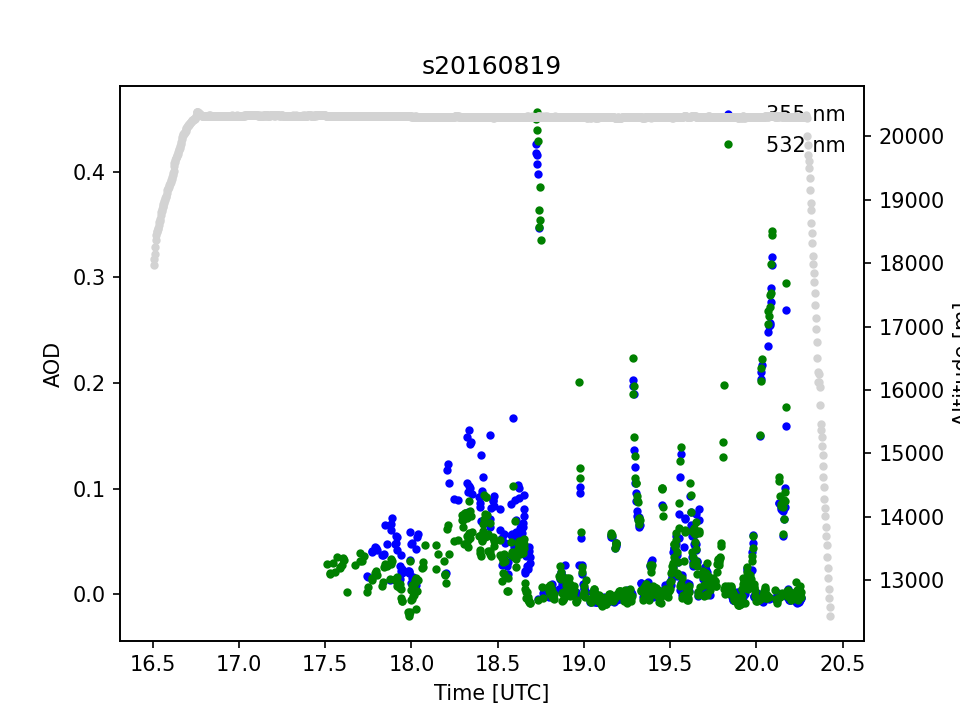

<IPython.core.display.Javascript object>


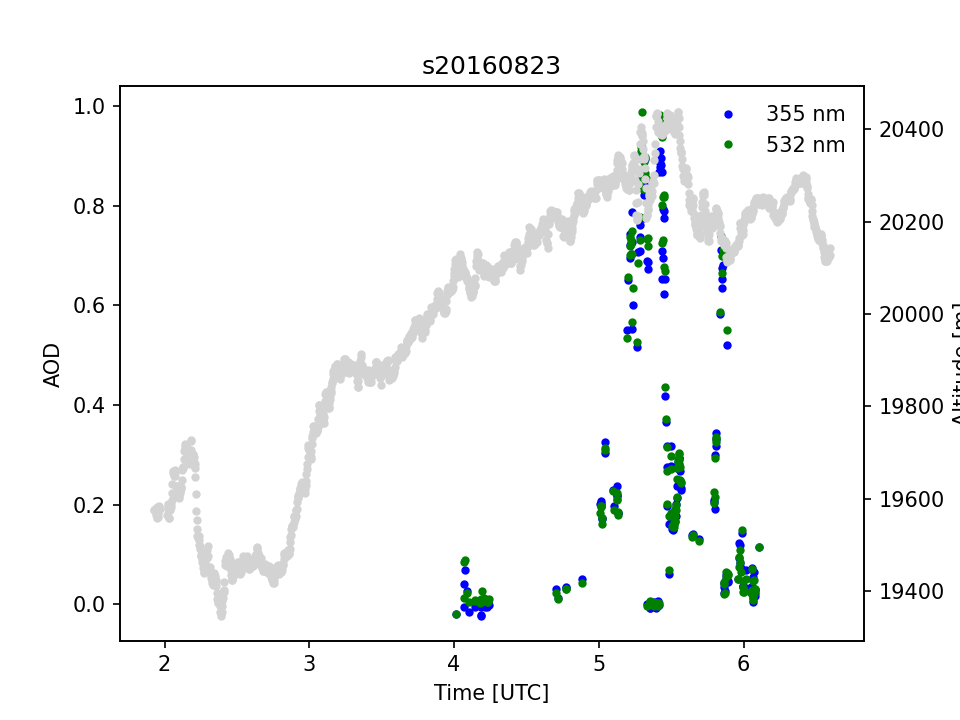

<IPython.core.display.Javascript object>


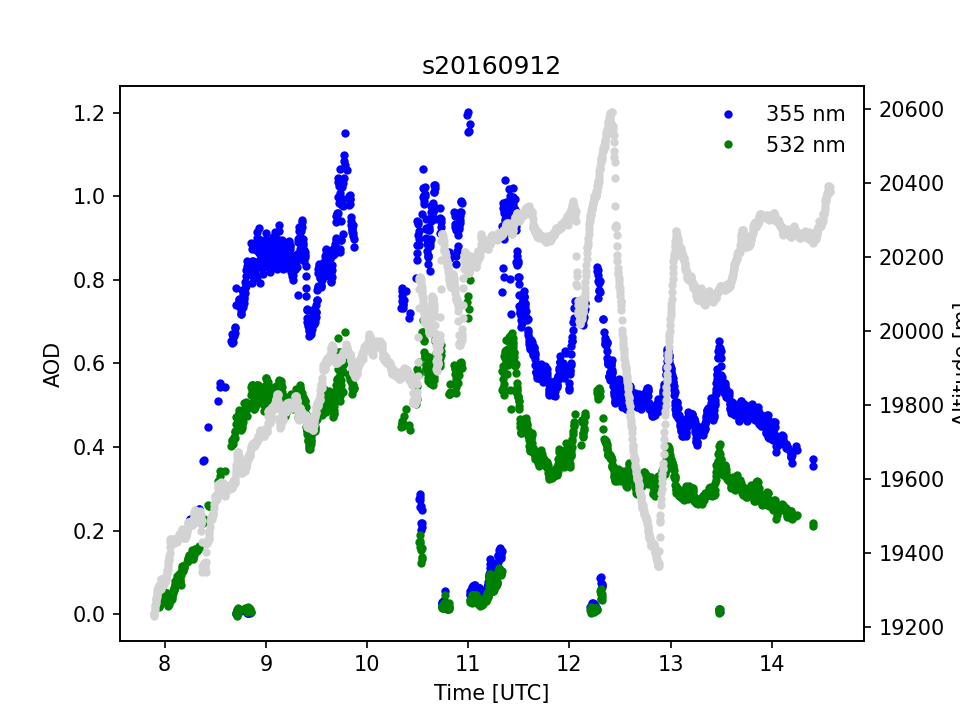

<IPython.core.display.Javascript object>


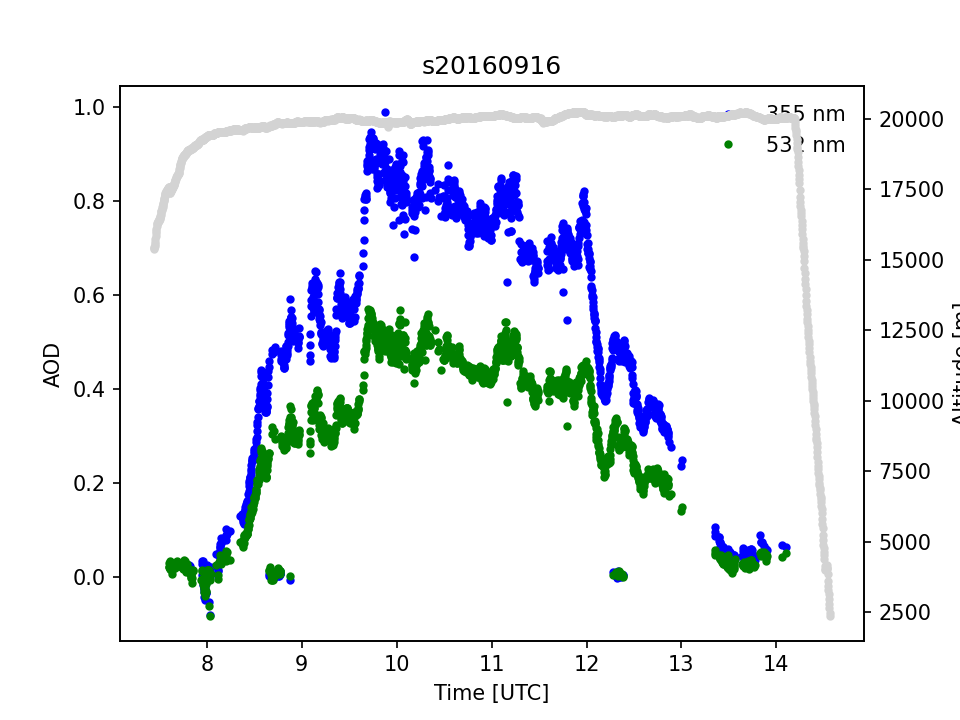

<IPython.core.display.Javascript object>


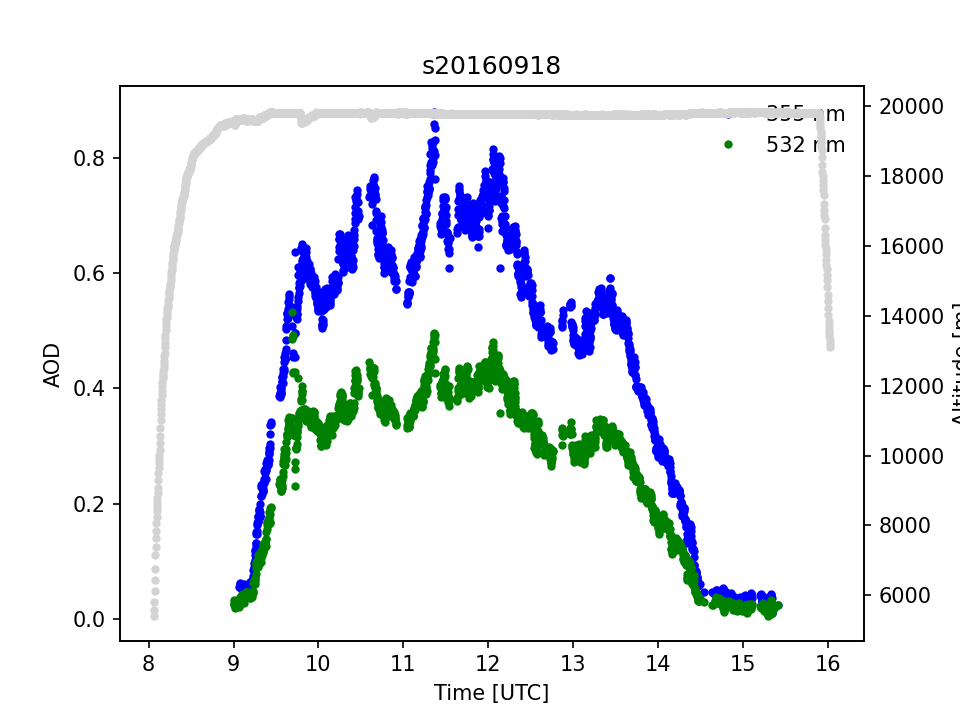

<IPython.core.display.Javascript object>


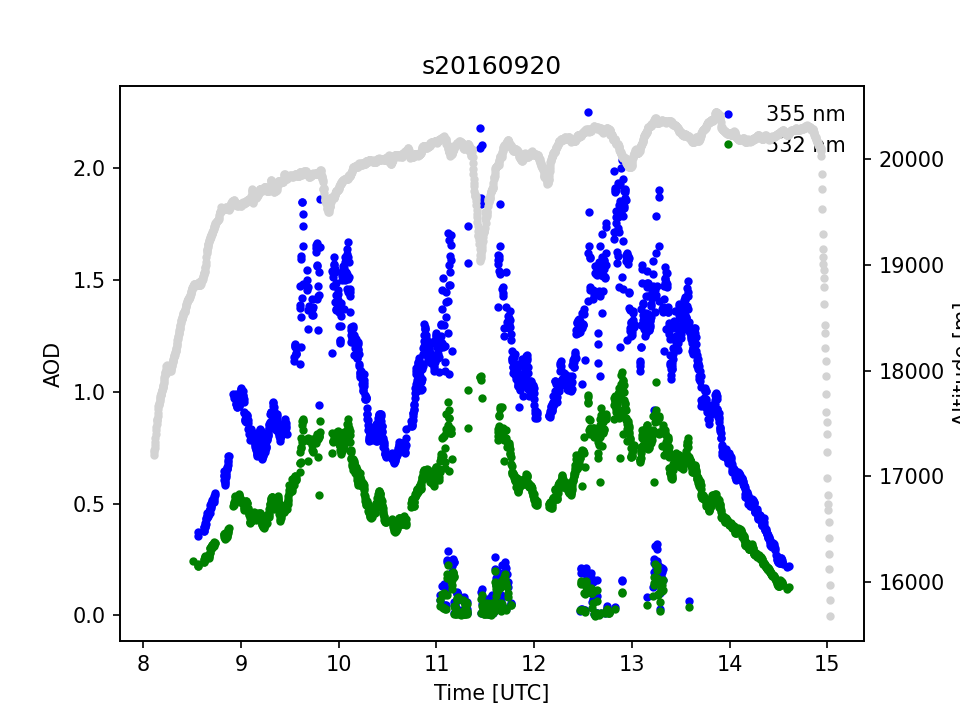

<IPython.core.display.Javascript object>


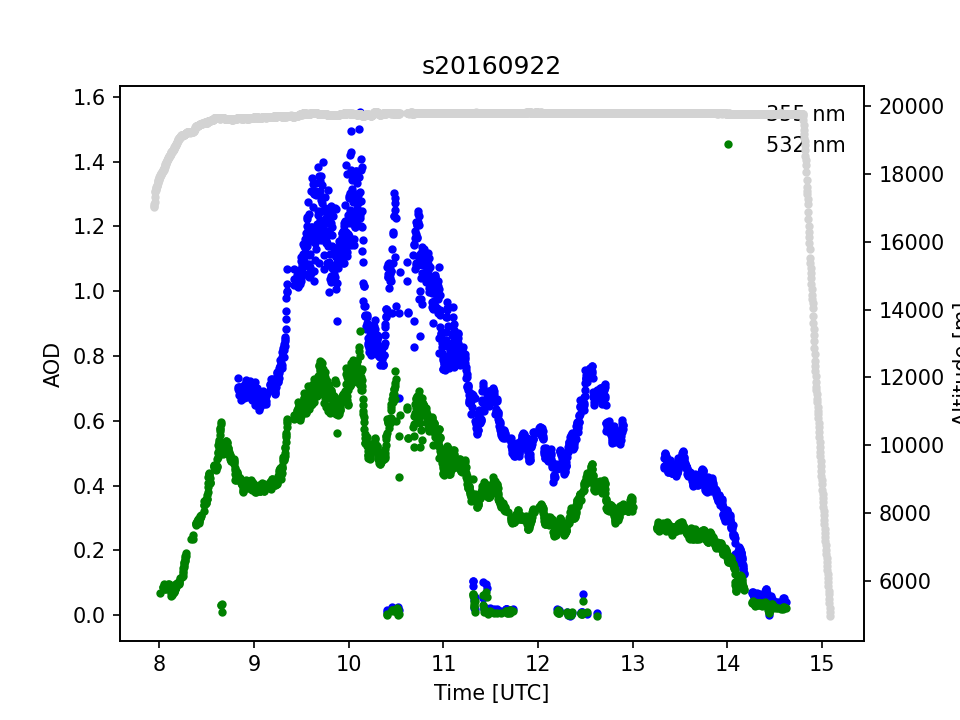

<IPython.core.display.Javascript object>


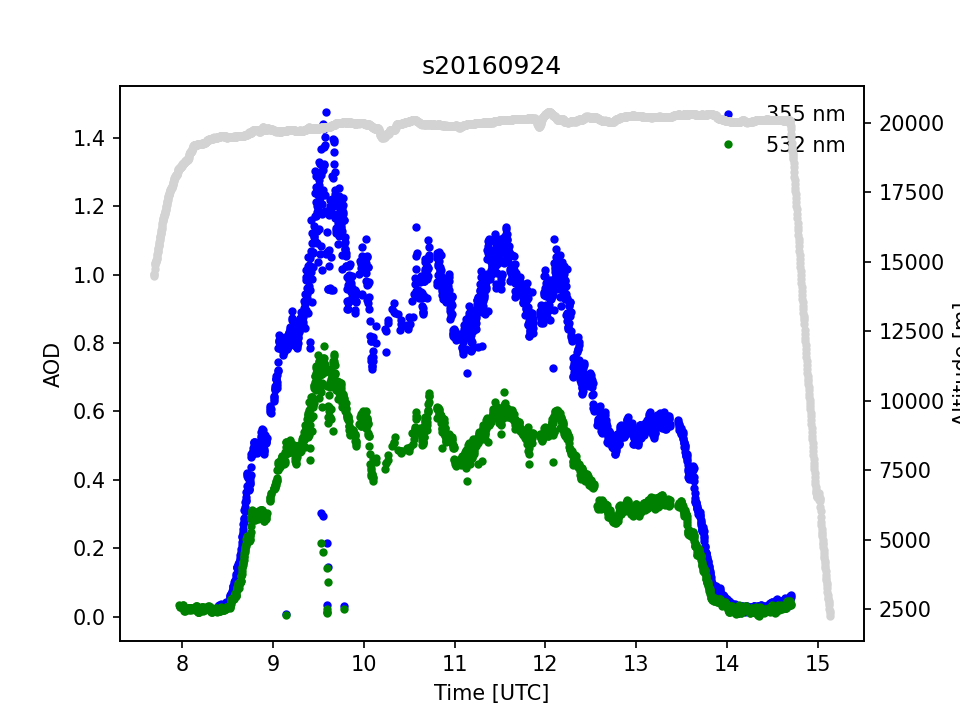

In [61]:
for sk in s6.keys():
    plt.figure()
    plt.plot(s6[sk]['time'],s6[sk]['acaod_355'],'b.',label='355 nm')
    plt.plot(s6[sk]['time'],s6[sk]['acaod_532'],'g.',label='532 nm')
    plt.title(sk)
    plt.legend(frameon=False,numpoints=1)
    plt.ylabel('AOD')
    plt.xlabel('Time [UTC]')
    ax = plt.gca()
    axy = ax.twinx()
    axy.plot(s6[sk]['time'],s6[sk]['alt'],'.',color='lightgrey')
    axy.set_ylabel('Altitude [m]')

<IPython.core.display.Javascript object>


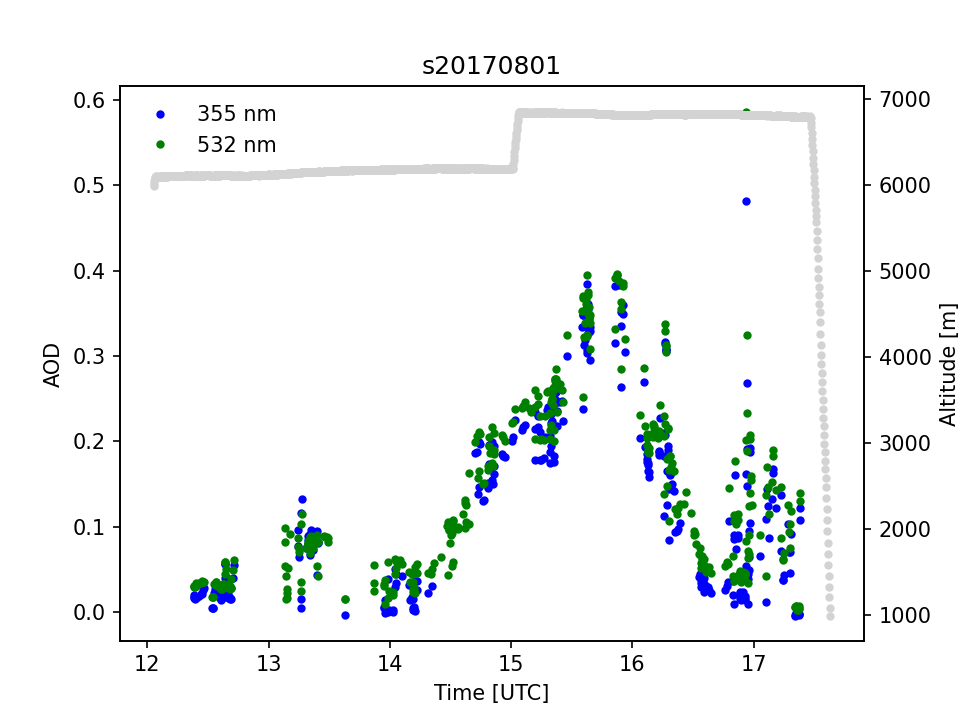

<IPython.core.display.Javascript object>


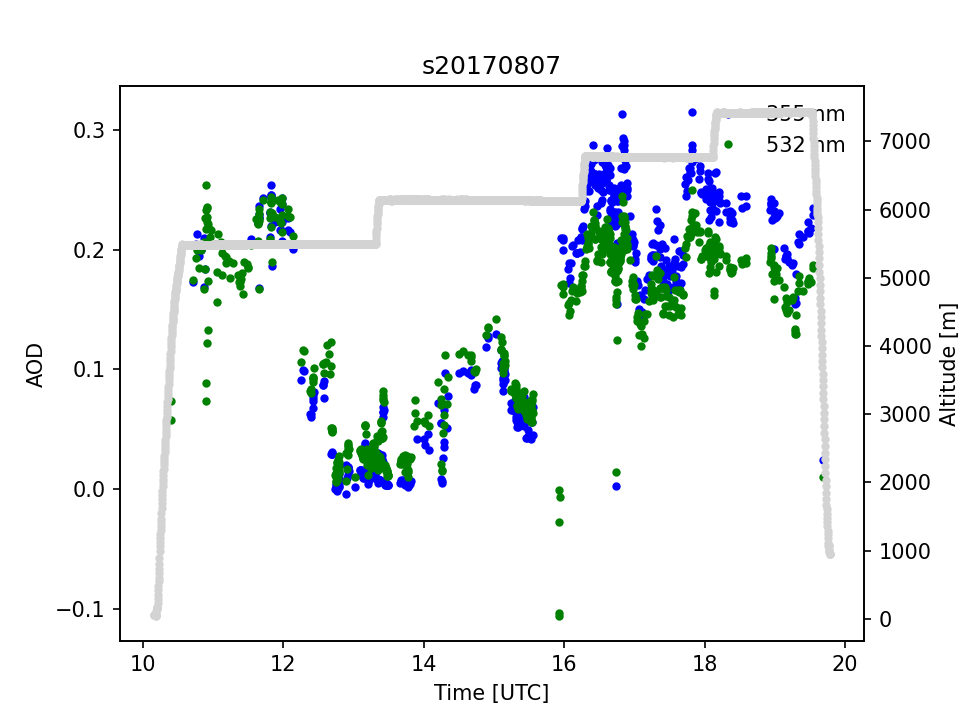

<IPython.core.display.Javascript object>


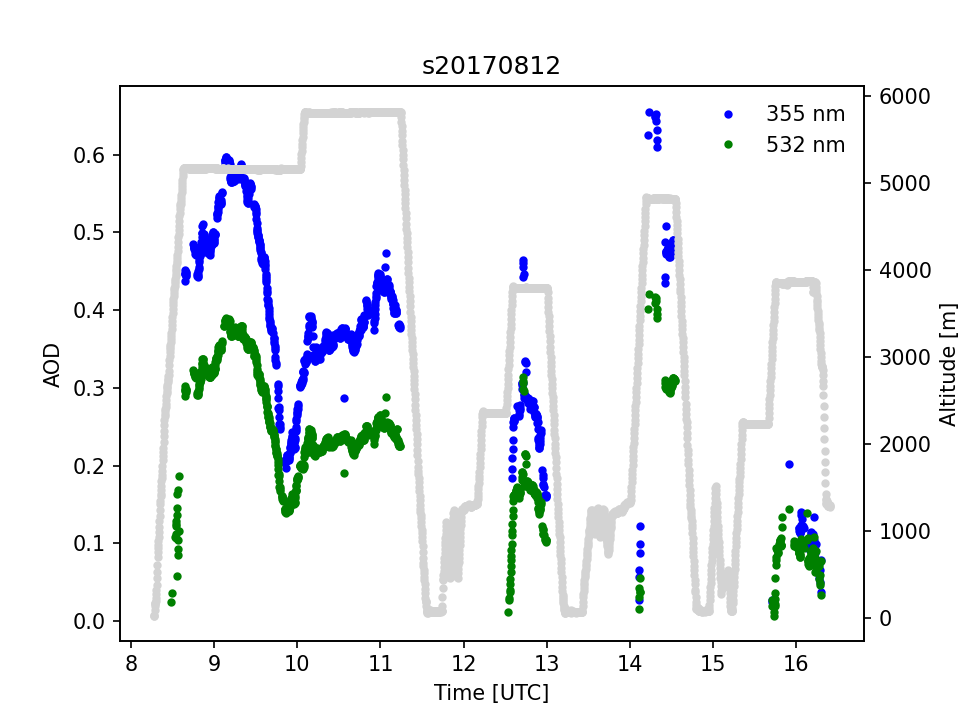

<IPython.core.display.Javascript object>


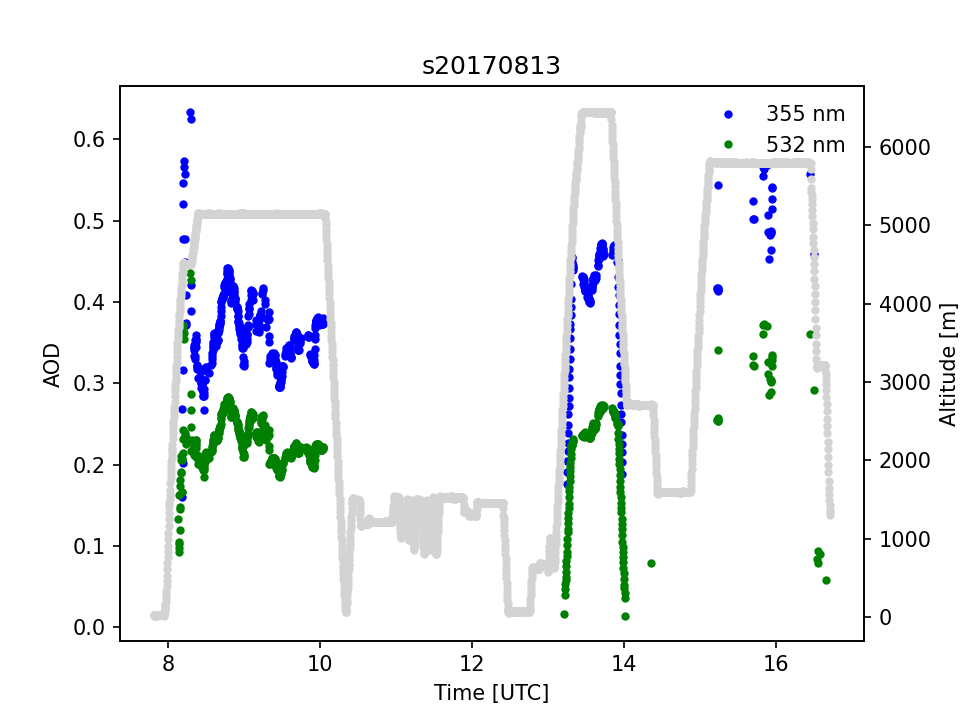

<IPython.core.display.Javascript object>


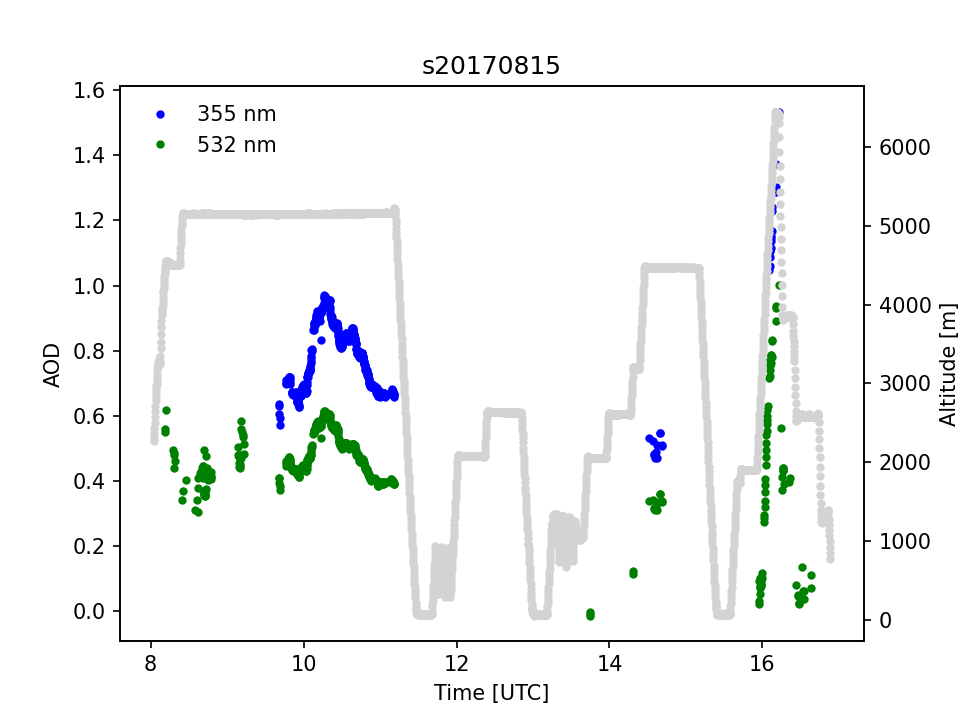

<IPython.core.display.Javascript object>


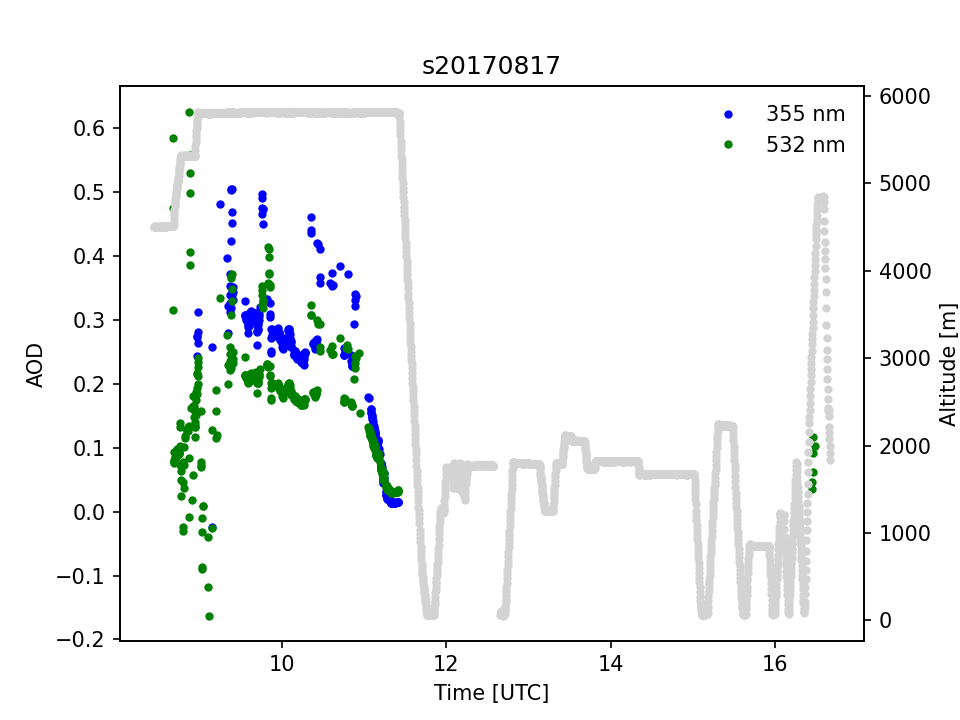

<IPython.core.display.Javascript object>


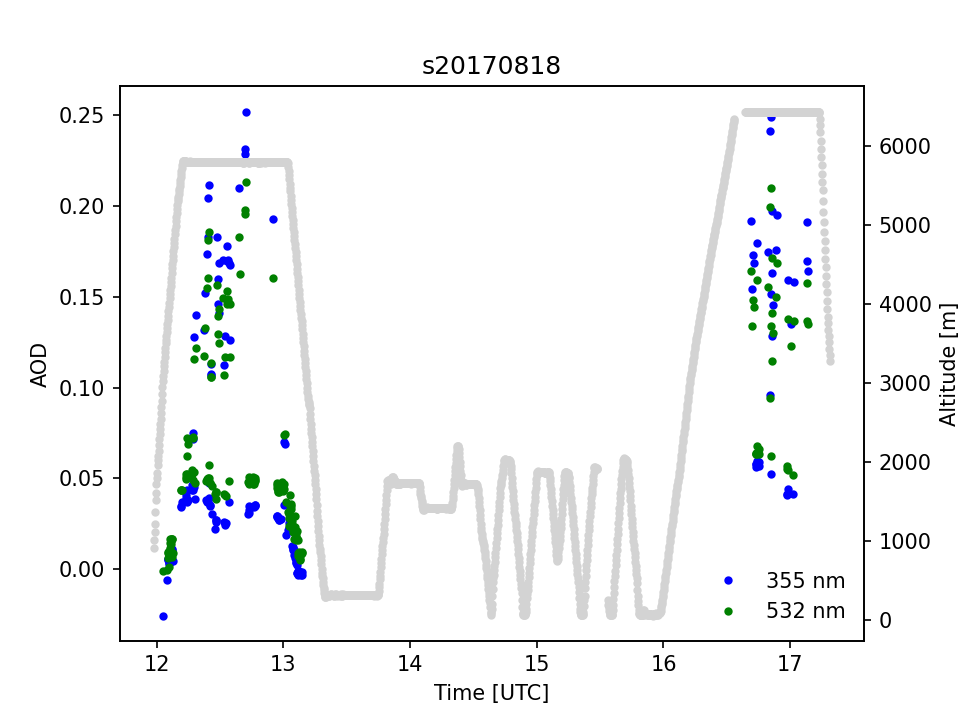

<IPython.core.display.Javascript object>


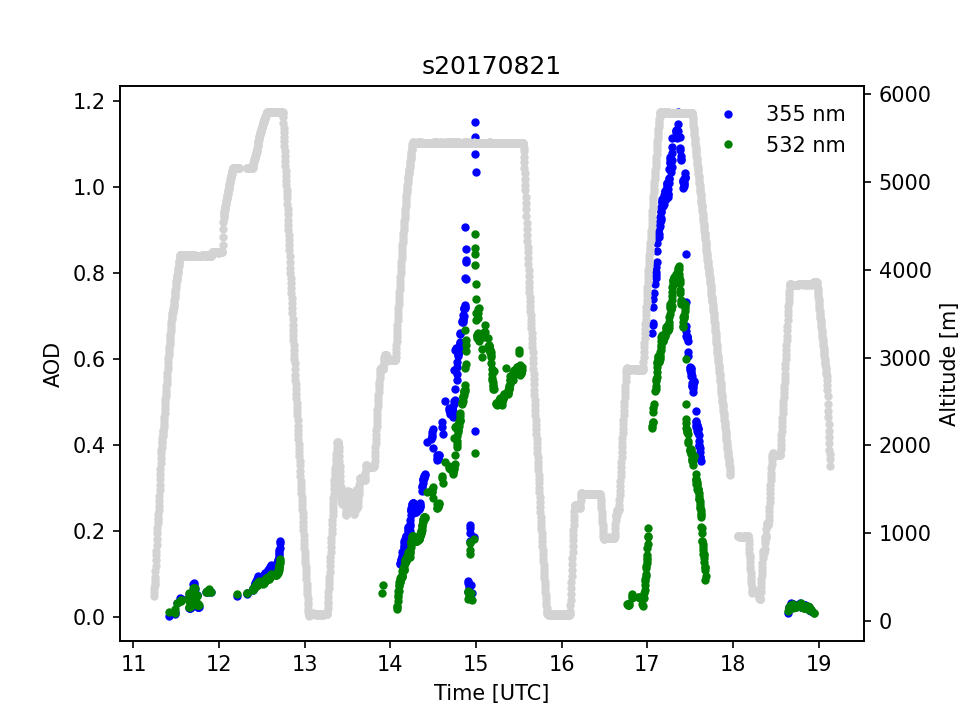

<IPython.core.display.Javascript object>


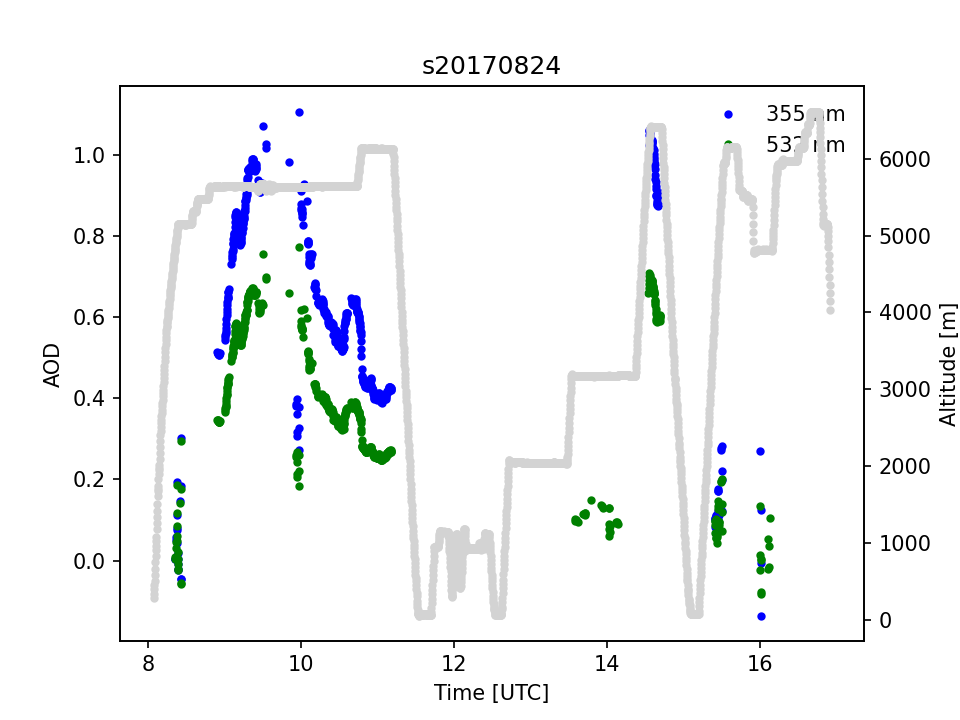

<IPython.core.display.Javascript object>


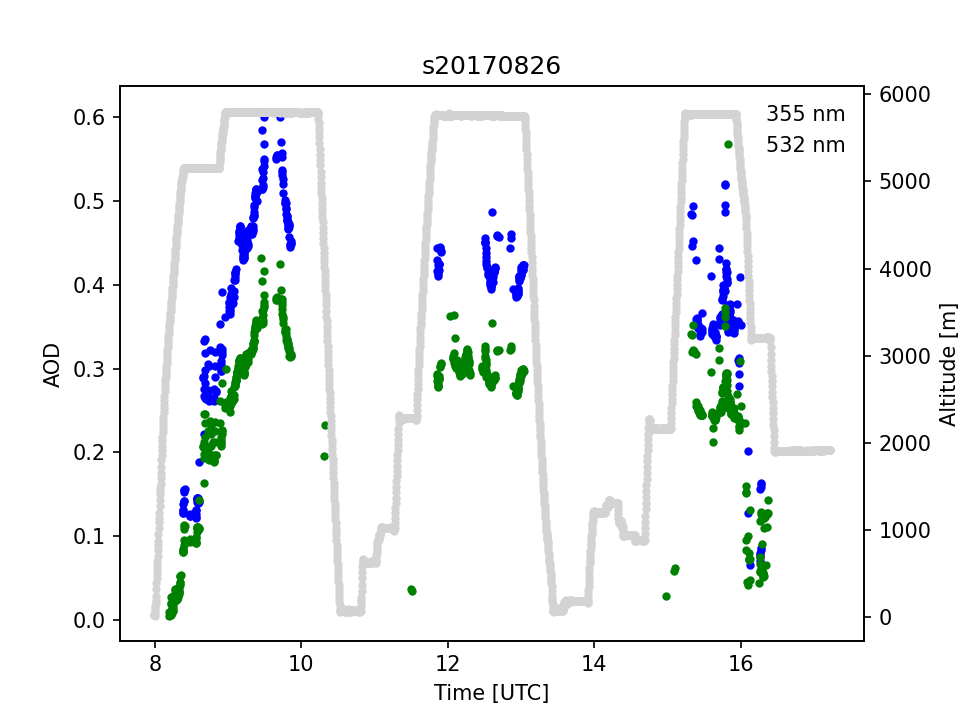

<IPython.core.display.Javascript object>


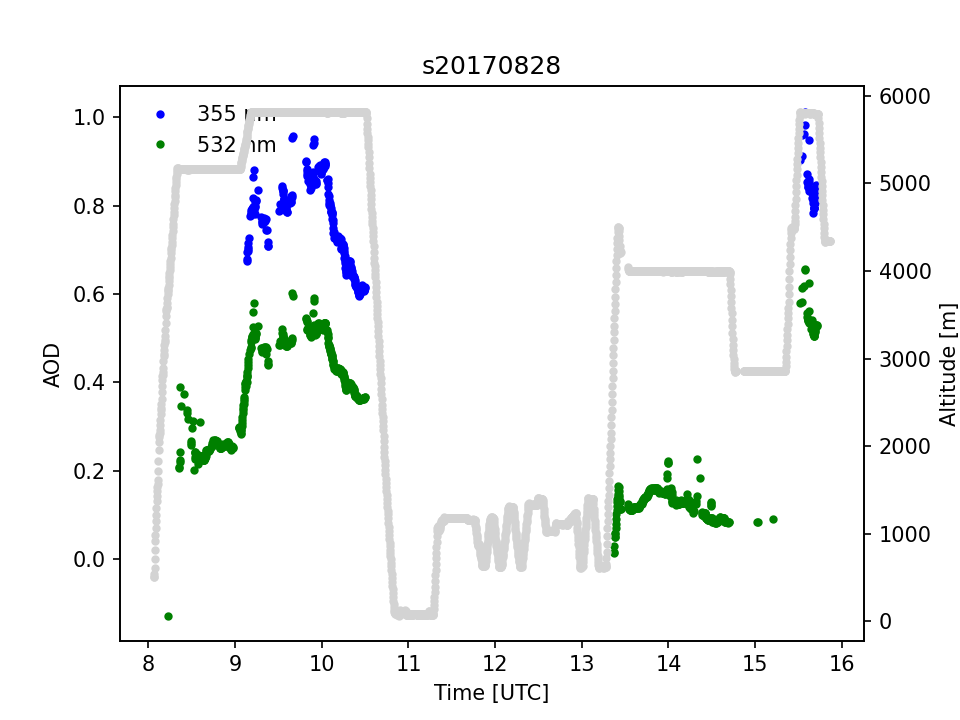

/tmp/ipykernel_1584044/2202628625.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<IPython.core.display.Javascript object>


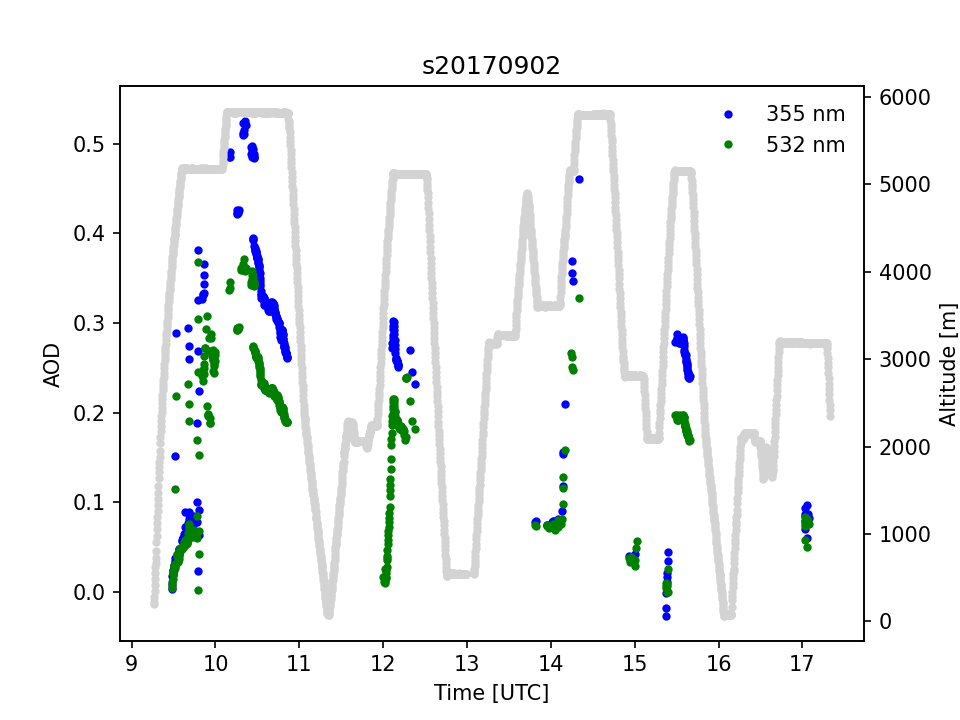

<IPython.core.display.Javascript object>


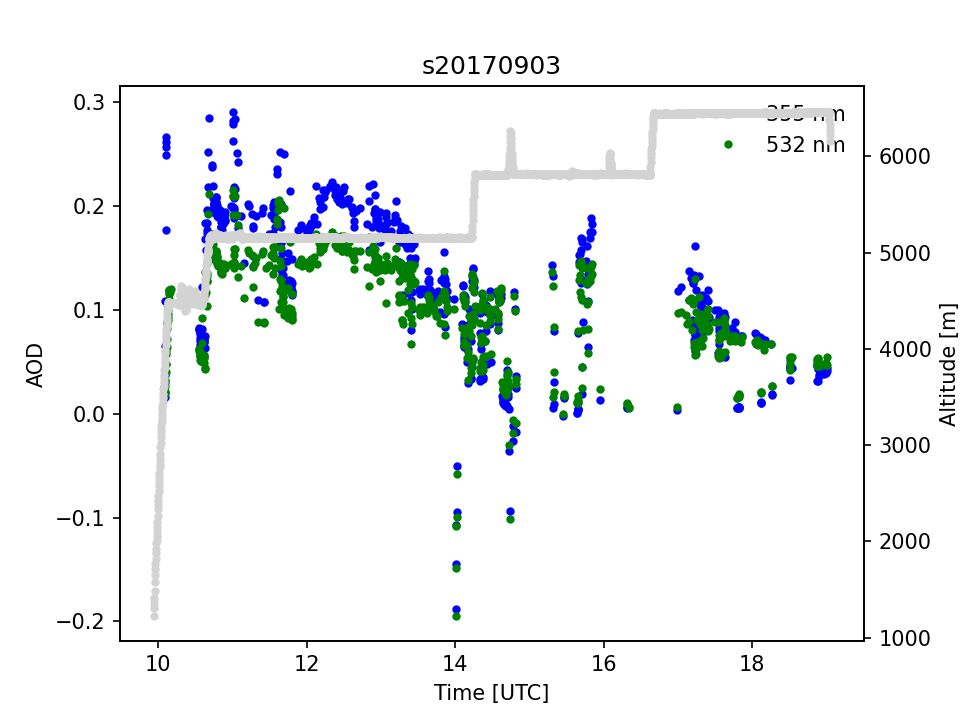

<IPython.core.display.Javascript object>


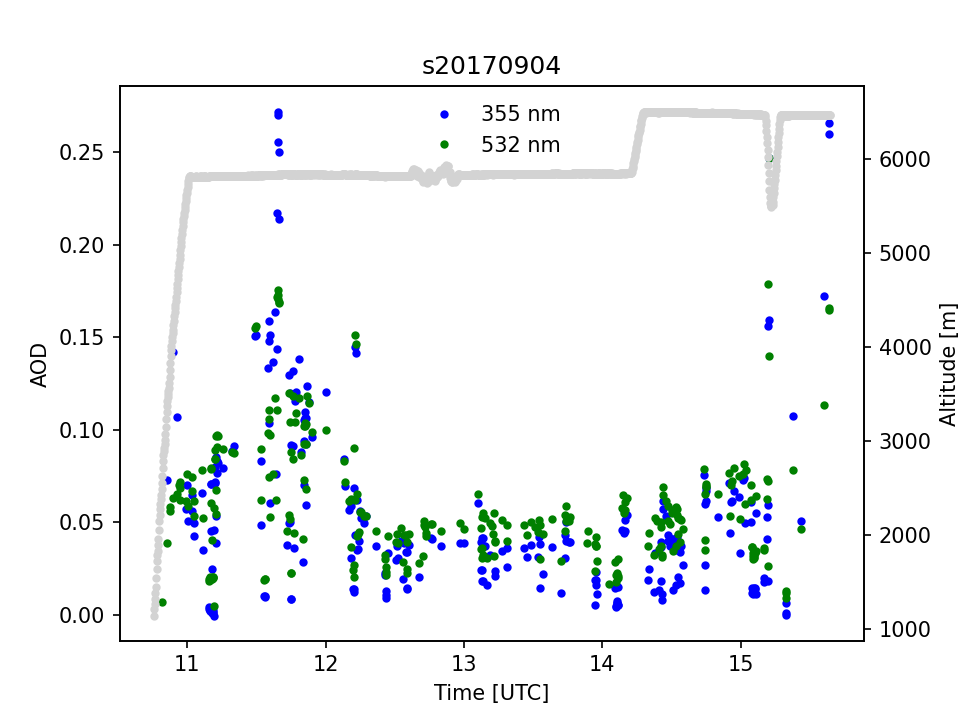

In [81]:
for sk in s7.keys():
    plt.figure()
    plt.plot(s7[sk]['time'],s7[sk]['acaod_355'],'b.',label='355 nm')
    plt.plot(s7[sk]['time'],s7[sk]['acaod_532'],'g.',label='532 nm')
    plt.title(sk)
    plt.legend(frameon=False,numpoints=1)
    plt.ylabel('AOD')
    plt.xlabel('Time [UTC]')
    ax = plt.gca()
    axy = ax.twinx()
    axy.plot(s7[sk]['time'],s7[sk]['alt'],'.',color='lightgrey')
    axy.set_ylabel('Altitude [m]')

<IPython.core.display.Javascript object>


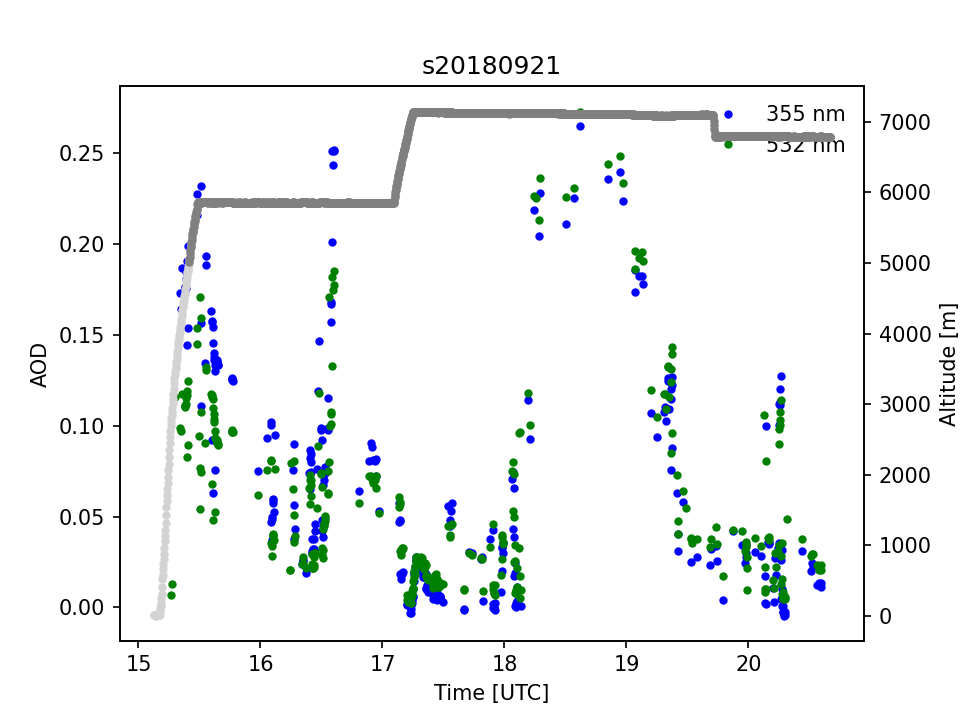

<IPython.core.display.Javascript object>


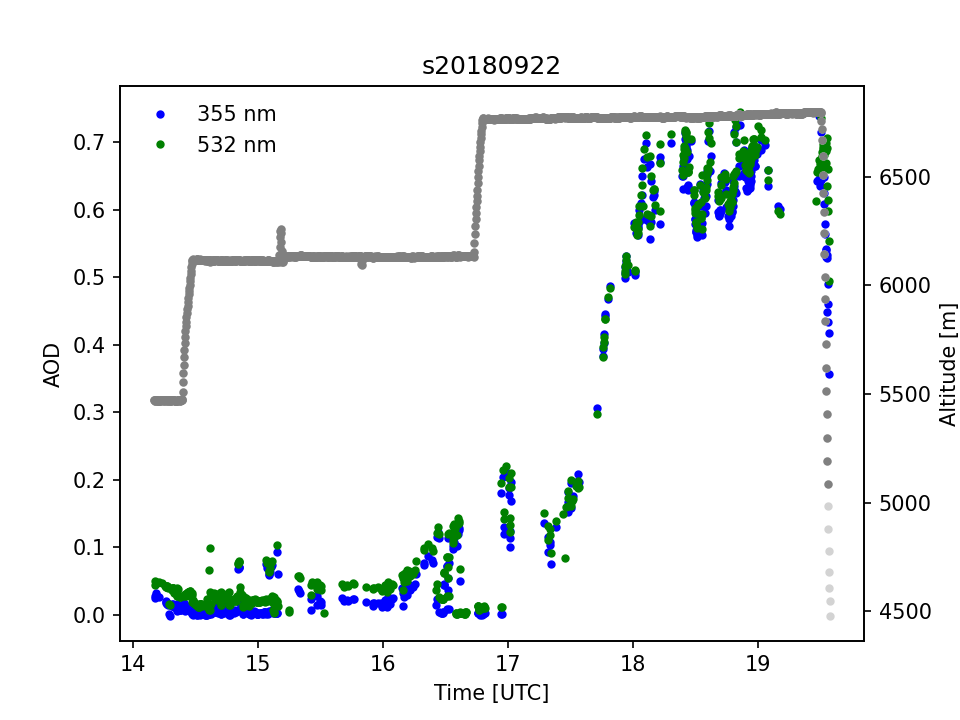

<IPython.core.display.Javascript object>


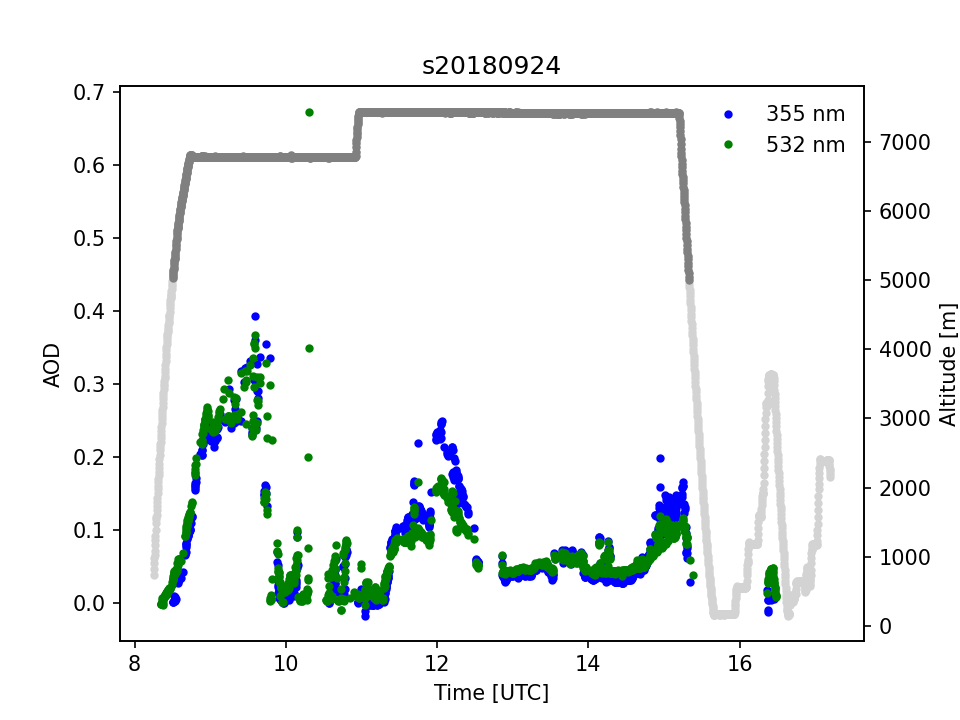

<IPython.core.display.Javascript object>


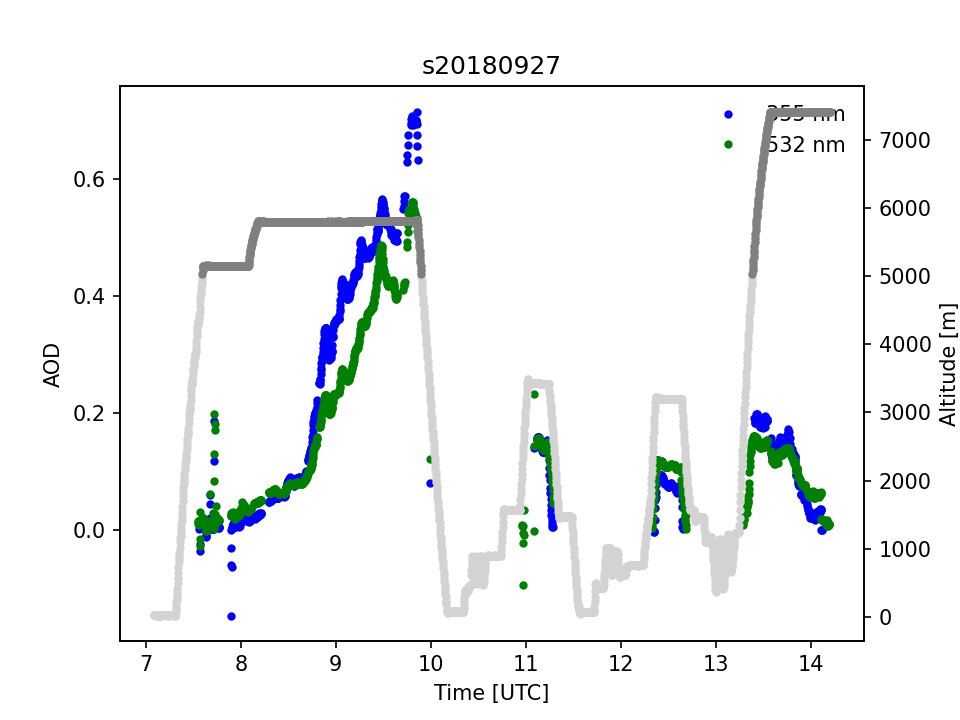

<IPython.core.display.Javascript object>


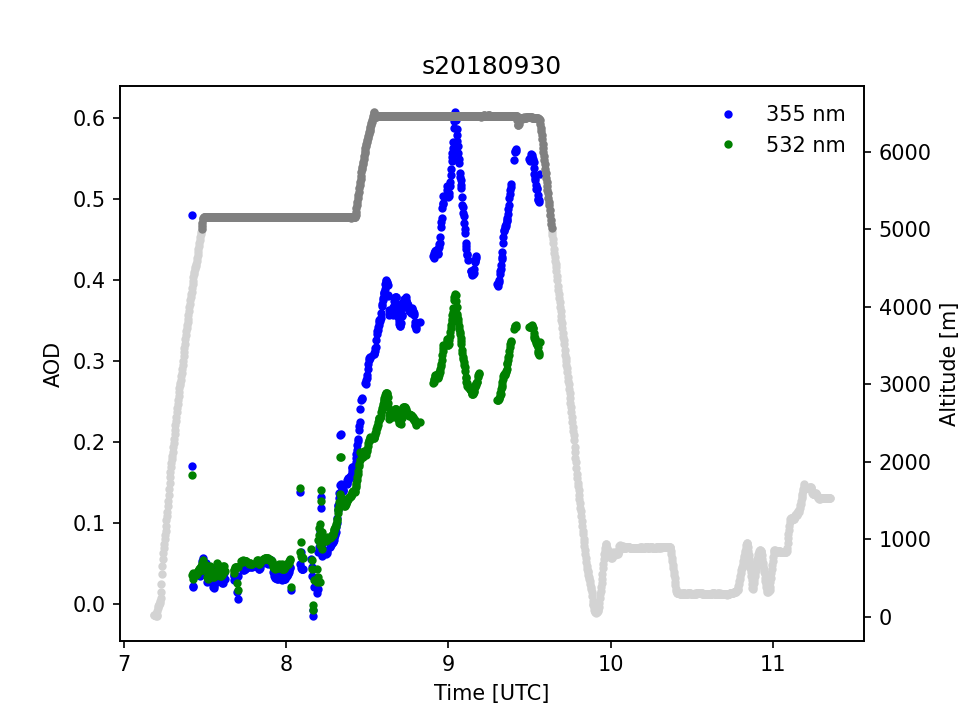

<IPython.core.display.Javascript object>


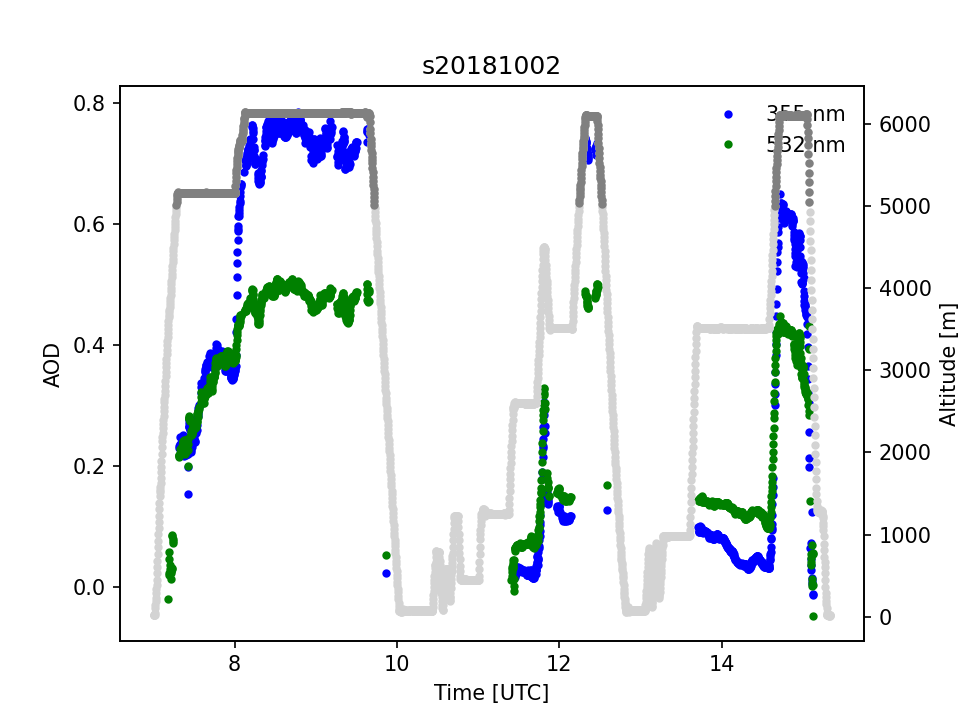

<IPython.core.display.Javascript object>


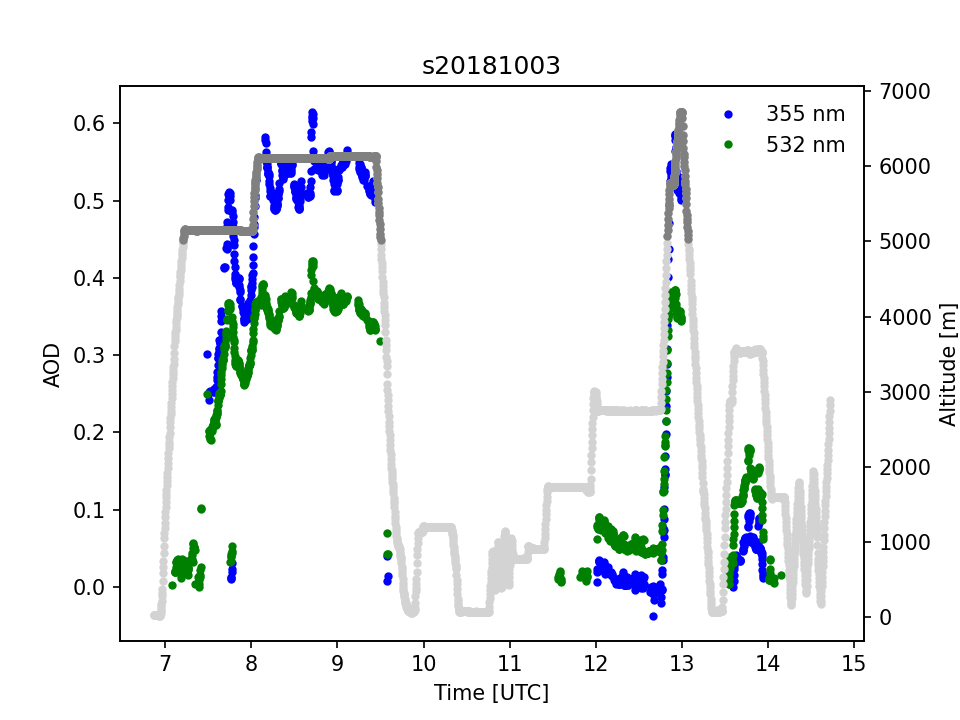

<IPython.core.display.Javascript object>


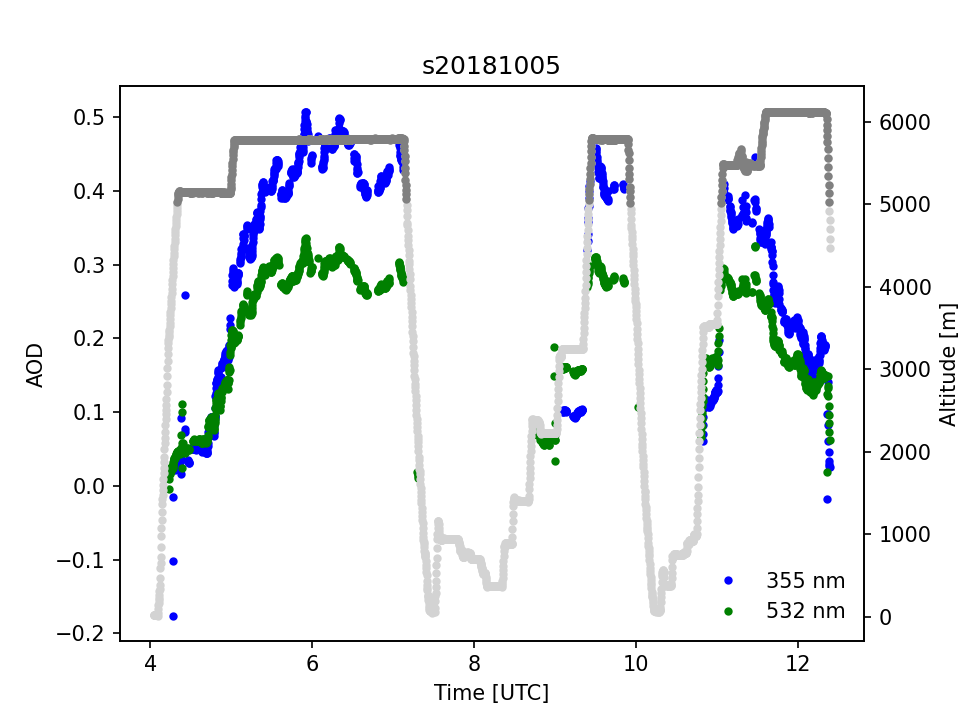

<IPython.core.display.Javascript object>


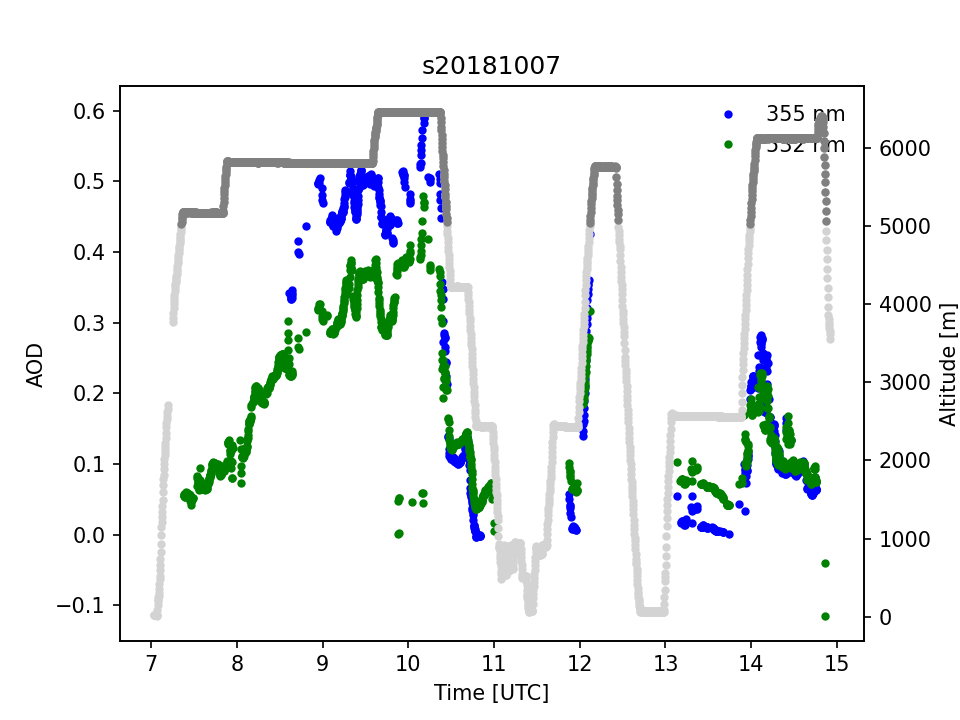

<IPython.core.display.Javascript object>


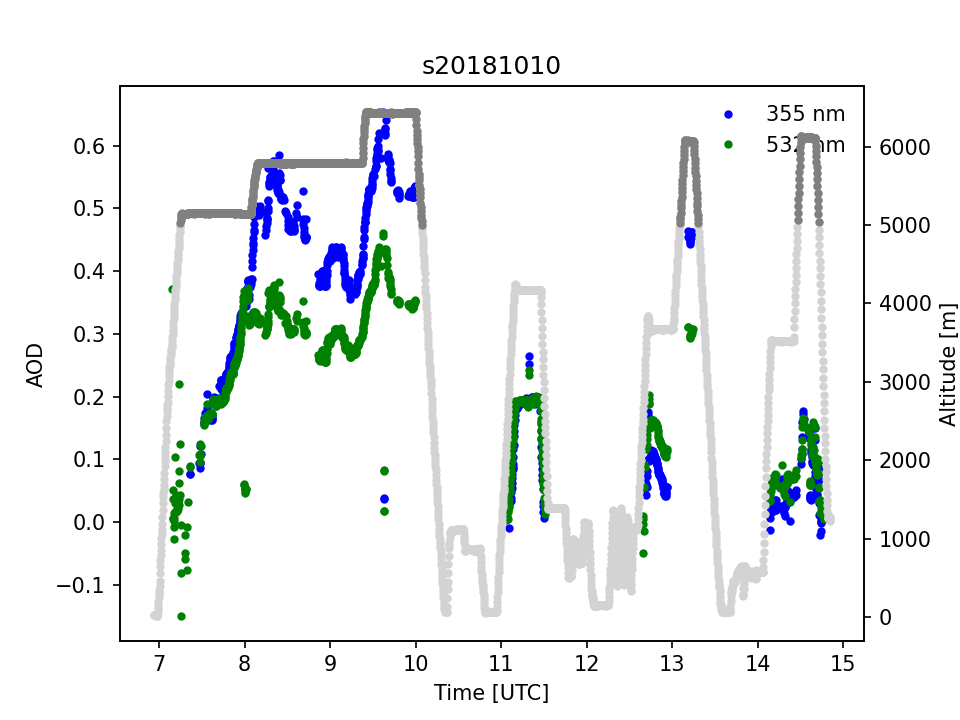

<IPython.core.display.Javascript object>


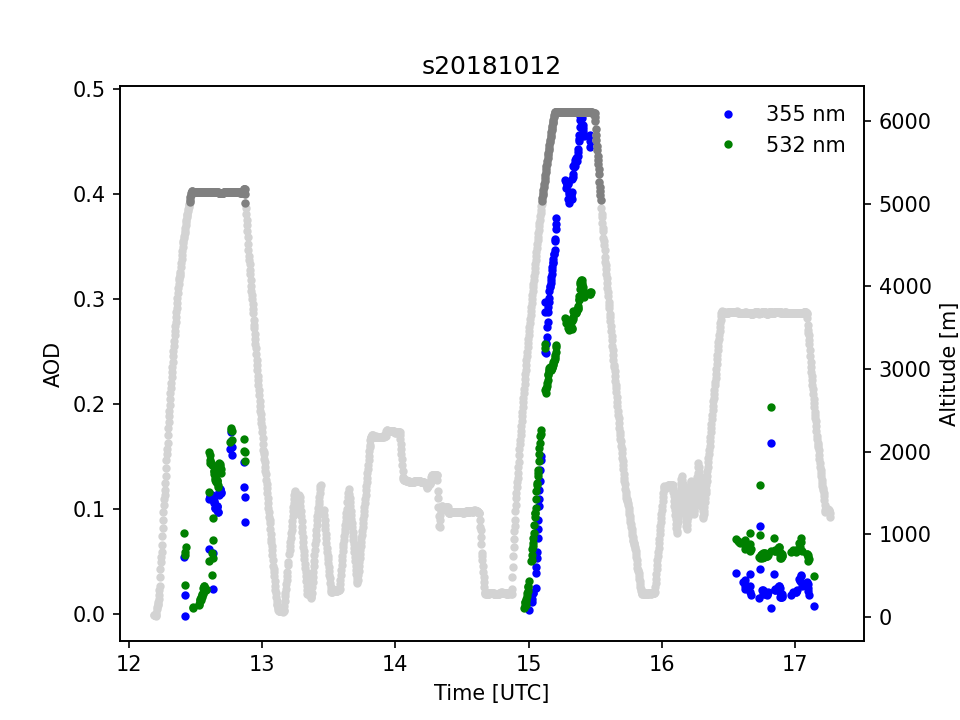

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


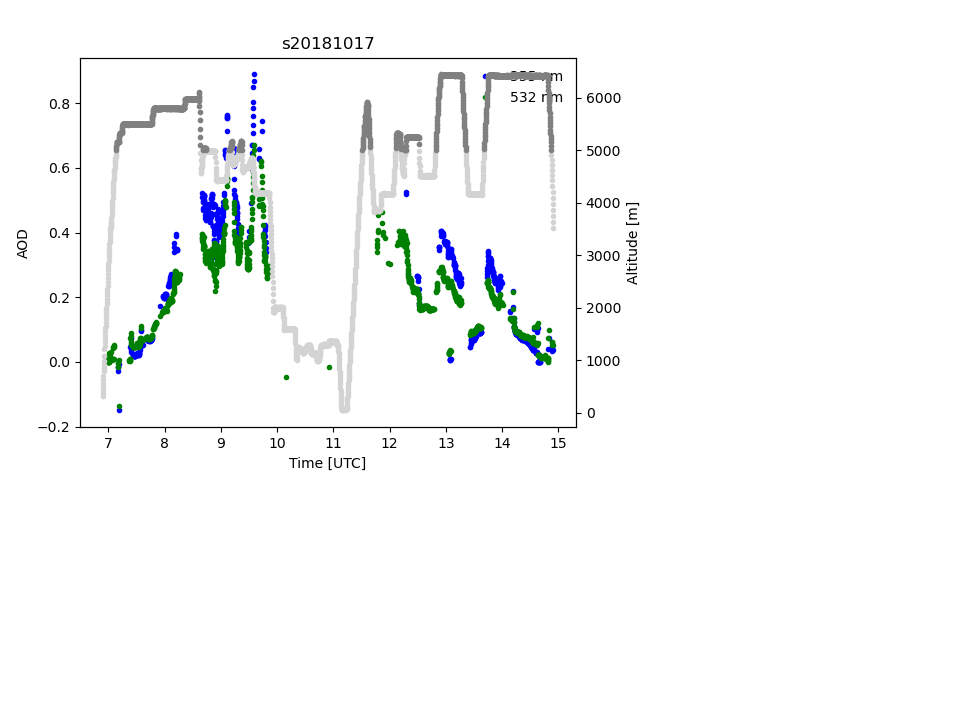

<IPython.core.display.Javascript object>


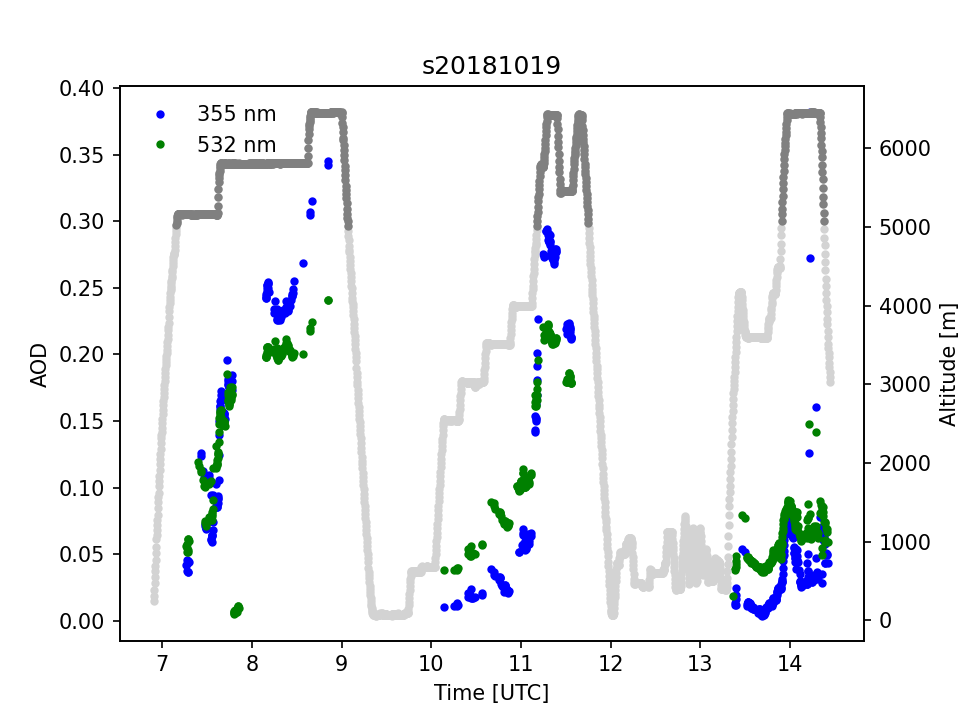

<IPython.core.display.Javascript object>


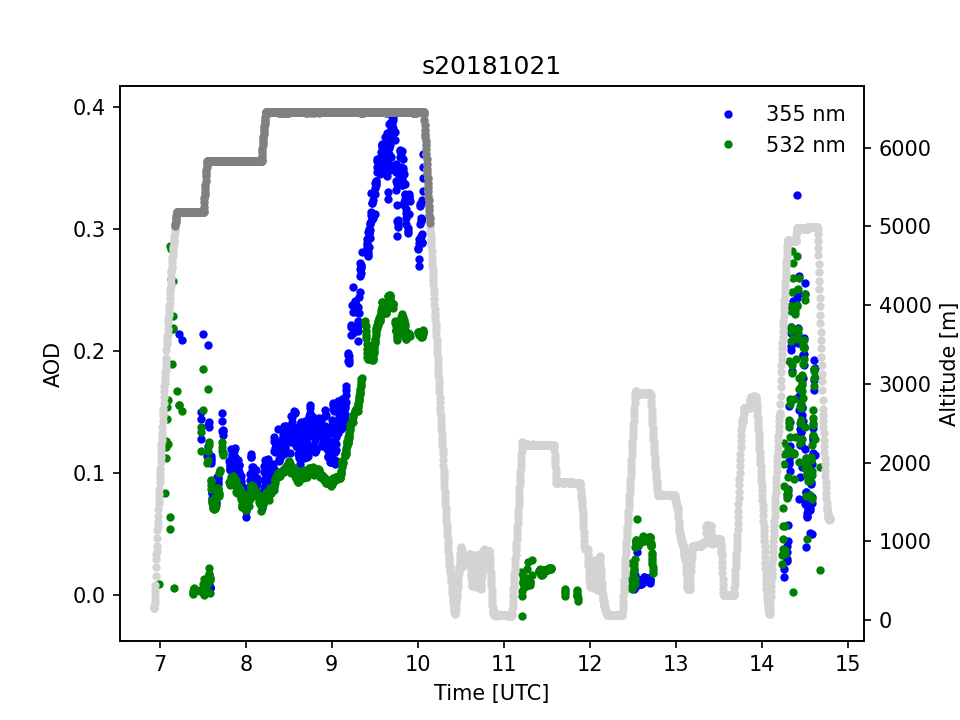

<IPython.core.display.Javascript object>


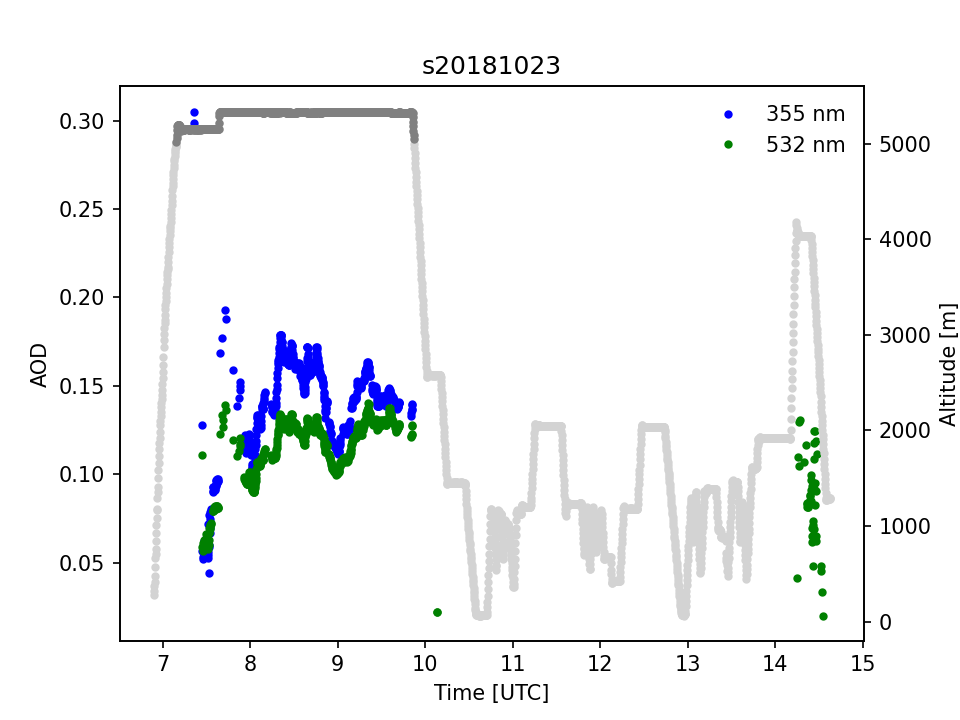

<IPython.core.display.Javascript object>


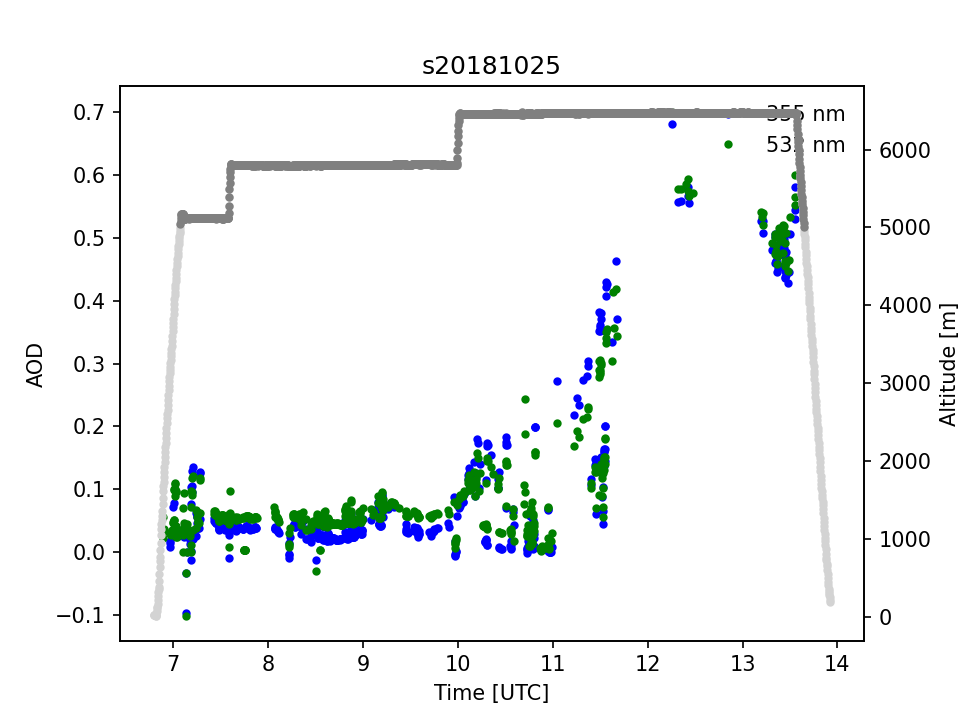

<IPython.core.display.Javascript object>


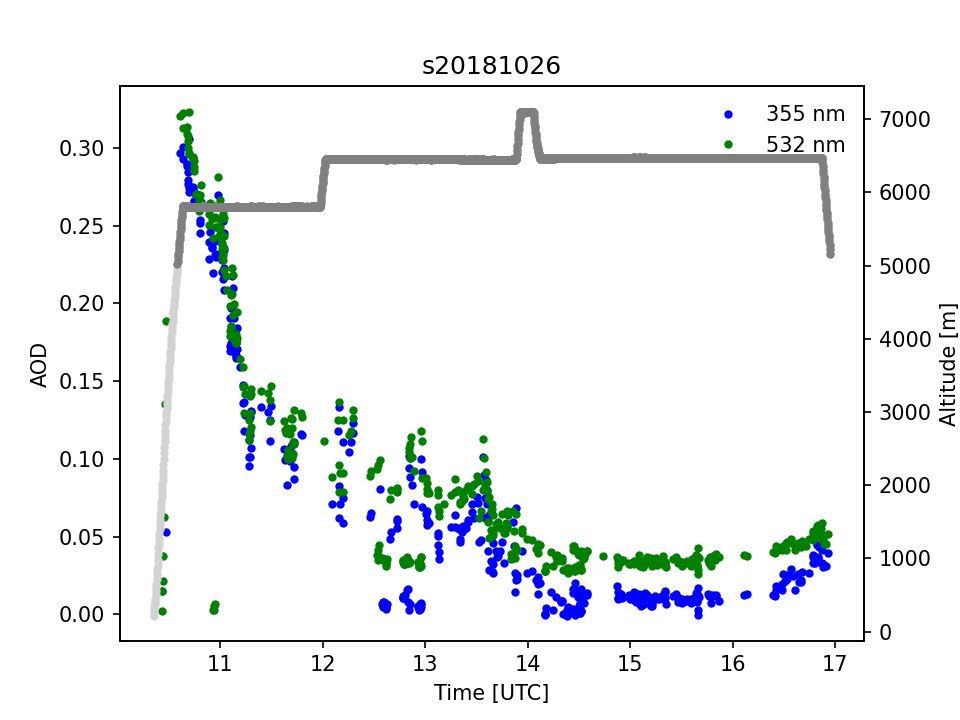

<IPython.core.display.Javascript object>


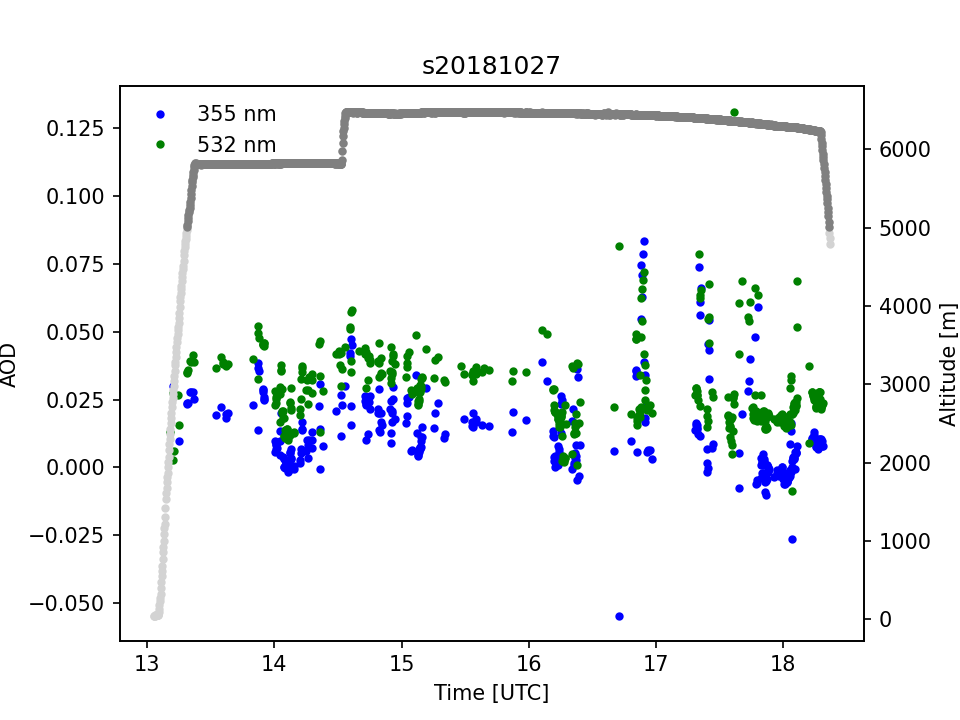

In [82]:
for sk in s8.keys():
    plt.figure()
    plt.plot(s8[sk]['time'],s8[sk]['acaod_355'],'b.',label='355 nm')
    plt.plot(s8[sk]['time'],s8[sk]['acaod_532'],'g.',label='532 nm')
    plt.title(sk)
    plt.legend(frameon=False,numpoints=1)
    plt.ylabel('AOD')
    plt.xlabel('Time [UTC]')
    ax = plt.gca()
    axy = ax.twinx()
    axy.plot(s8[sk]['time'],s8[sk]['alt'],'.',color='lightgrey')
    axy.plot(s8[sk]['time'][s8[sk]['fl']],s8[sk]['alt'][s8[sk]['fl']],'.',color='grey')
    axy.set_ylabel('Altitude [m]')

In [86]:
hr6.keys()

dict_keys(['lat', 'lon', 'alt', 'time', 'header', 'acaod_355', 'acaod_532', 'acaod_355_unc', 'acaod_532_unc', 'cloud_top_height', 'date', 'filename', 'aero_bot_height', 'gap_dist'])

In [249]:
hr6['date']

array([20160819., 20160819., 20160819., ..., 20160924., 20160924.,
       20160924.])

In [89]:
len(hr6['date'])

18534

In [94]:
hr6['daysd'] = ['{:8.0f}'.format(d) for d in hr6['date']]

In [97]:
len(a_daystr_e)

92

In [55]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    print(hstr)
    hr6['mod_AAOD'+hstr]=np.zeros_like(hr6['acaod_532'])+np.nan
    hr6['mod_AAOD2'+hstr]=np.zeros_like(hr6['acaod_532'])+np.nan
    hr6['mod_AAOD_UNC'+hstr]=np.zeros_like(hr6['acaod_532'])+np.nan
    hr6['mod_AAOD2_UNC'+hstr]=np.zeros_like(hr6['acaod_532'])+np.nan
    for d in tqdm(hsrl_days6,desc='days'):
        i_daymod = np.where(np.array(a_daystr_e)==d)[0]
        i_dayar = np.where((np.array(hr6['date'])==float(d)) & np.isfinite(hr6['lat']) &\
                           np.isfinite(hr6['acaod_532']))[0]
        print(d,len(i_daymod))
        if len(i_dayar)<1: continue
        for i in tqdm(i_daymod,desc='is'):
            # filter by time
            fl_time = (hr6['ndtime2'][i_dayar]>(a_time_e[i]-timedelta(hours=to))) &\
                        (hr6['ndtime2'][i_dayar]<a_time_e[i]+timedelta(hours=to))
            if (lat_e[i].max()>np.nanmin(hr6['lat'][i_dayar])) & (lat_e[i].min()<np.nanmax(hr6['lat'][i_dayar])) &\
             (lon_e[i].max()>np.nanmin(hr6['lon'][i_dayar])) & (lon_e[i].min()<np.nanmax(hr6['lon'][i_dayar])) & any(fl_time):

                out = mu.stats_within_radius(hr6['lat'][i_dayar][fl_time],hr6['lon'][i_dayar][fl_time],
                                          lat_e[i],lon_e[i],aaod_e[i],rad/2.0,subset=False)
                np.put(hr6['mod_AAOD'+hstr],i_dayar[fl_time],out['mean'])
                aaod2_tmp = np.array([np.nanmean(aaod2_e[i].flatten()[io]) for io in out['index']])
                aaod_unc_tmp = np.array([np.nanmean(aaod_e_unc[i].flatten()[io]) for io in out['index']])
                aaod2_unc_tmp = np.array([np.nanmean(aaod2_e_unc[i].flatten()[io]) for io in out['index']])
                np.put(hr6['mod_AAOD2'+hstr],i_dayar[fl_time],aaod2_tmp)
                np.put(hr6['mod_AAOD_UNC'+hstr],i_dayar[fl_time],aaod_unc_tmp*out['mean']/100.0)
                np.put(hr6['mod_AAOD2_UNC'+hstr],i_dayar[fl_time],aaod2_unc_tmp*aaod2_tmp/100.0)
                


In [56]:
np.save(fpo+'mod_ACAERO_match_HSRL.npy',hr6,allow_pickle=True)

## Plot the scatter plots

### 4STAR

In [50]:
ar6.keys()

dict_keys(['AOD0355', 'AOD0380', 'AOD0452', 'AOD0470', 'AOD0501', 'AOD0520', 'AOD0530', 'AOD0532', 'AOD0550', 'AOD0606', 'AOD0620', 'AOD0660', 'AOD0675', 'AOD0700', 'AOD0781', 'AOD0865', 'AOD1020', 'AOD1040', 'AOD1064', 'AOD1236', 'AOD1250', 'AOD1559', 'AOD1627', 'AOD1650', 'AOD_angstrom_470_865', 'AOD_polycoef_a0', 'AOD_polycoef_a1', 'AOD_polycoef_a2', 'GPS_Alt', 'Latitude', 'Longitude', 'Start_UTC', 'UNCAOD0355', 'UNCAOD0380', 'UNCAOD0452', 'UNCAOD0470', 'UNCAOD0501', 'UNCAOD0520', 'UNCAOD0530', 'UNCAOD0532', 'UNCAOD0550', 'UNCAOD0606', 'UNCAOD0620', 'UNCAOD0660', 'UNCAOD0675', 'UNCAOD0700', 'UNCAOD0781', 'UNCAOD0865', 'UNCAOD1020', 'UNCAOD1040', 'UNCAOD1064', 'UNCAOD1236', 'UNCAOD1250', 'UNCAOD1559', 'UNCAOD1627', 'UNCAOD1650', 'amass_aer', 'days', 'fl', 'fl1', 'fl2', 'fl3', 'fl_QA', 'fl_alt', 'fl_alt_18', 'fl_alt_22', 'fl_alt_6', 'fl_routine', 'flac', 'flacr', 'flag_acaod', 'flr', 'qual_flag', 'flaco', 'flo', 'daysd', 'ndtime2', 'mod_AAOD_2.00h', 'mod_AAOD2_2.00h', 'mod_AAOD_UNC_2.

In [51]:
fl = (ar6['flag_acaod']==1) & ar6['fl']
flo = (ar6['flag_acaod']==1) & ar6['fl'] & (ar6['mod_AAOD']>-0.2) &\
       np.isfinite(ar6['mod_AAOD']) & np.isfinite(ar6['AOD0550']) & (ar6['AOD0550']>0.02)

KeyError: 'mod_AAOD'

In [ ]:
plt.figure()
plt.hist([ar6['mod_AAOD'][flo],ar6['AOD0550'][flo]],bins=50,label=['MOD ACAERO','4STAR AAOD'])
plt.legend()
plt.xlabel('AOD [550 nm]')
plt.savefig(fpo+'MODACAERO_vs_4STAR_hist.png',dpi=600,transparent=True)


In [ ]:
plt.figure()
plt.hist([ar6['mod_AAOD'][flo],ar6['mod_AAOD_UNC'][flo]],bins=50,label=['MOD ACAERO','MOD ACAERO Uncertainty'])
plt.legend()
plt.xlabel('AOD [550 nm]')
plt.savefig(fpo+'MODACAERO_vs_Uncertainty_hist.png',dpi=600,transparent=True)


In [ ]:
ar6.keys()

In [ ]:
fig,ax = plt.subplots(1,1)
rbin = np.corrcoef(ar6['AOD0550'][flo],ar6['mod_AAOD'][flo])[0,1]**2.0
rmse = np.sqrt(np.nanmean((ar6['AOD0550'][flo]-ar6['mod_AAOD'][flo])**2.0))
num = len(ar6['mod_AAOD'][flo])
plt.plot(ar6['AOD0550'][flo],ar6['mod_AAOD'][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
plt.errorbar(ar6['AOD0550'][flo],ar6['mod_AAOD'][flo],xerr=ar6['UNCAOD0550'][flo],yerr=ar6['mod_AAOD_UNC'][flo]/100.0*ar6['mod_AAOD'][flo],
             marker='.',color='tab:blue',linestyle='None',alpha=0.2)
plt.xlabel('4STAR ACAOD [550 nm]')
plt.ylabel('MODIS ACAERO (v1) [550 nm]')
pu.plot_lin(ar6['AOD0550'][flo],ar6['mod_AAOD'][flo],
            x_err=ar6['UNCAOD0550'][flo],y_err=ar6['mod_AAOD_UNC'][flo]*ar6['mod_AAOD'][flo],
            labels=True,shaded_ci=True,ci=95,ax=ax,
            use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with 4STAR abs. vs. 4STAR) +/- 2h')
plt.legend()
plt.xlim(-0.05,0.85)
plt.ylim(-0.05,0.85)
plt.savefig(fpo+'MODACAERO_vs_4STAR_ORACLES2016_550nm.png',dpi=600,transparent=True)


<IPython.core.display.Javascript object>


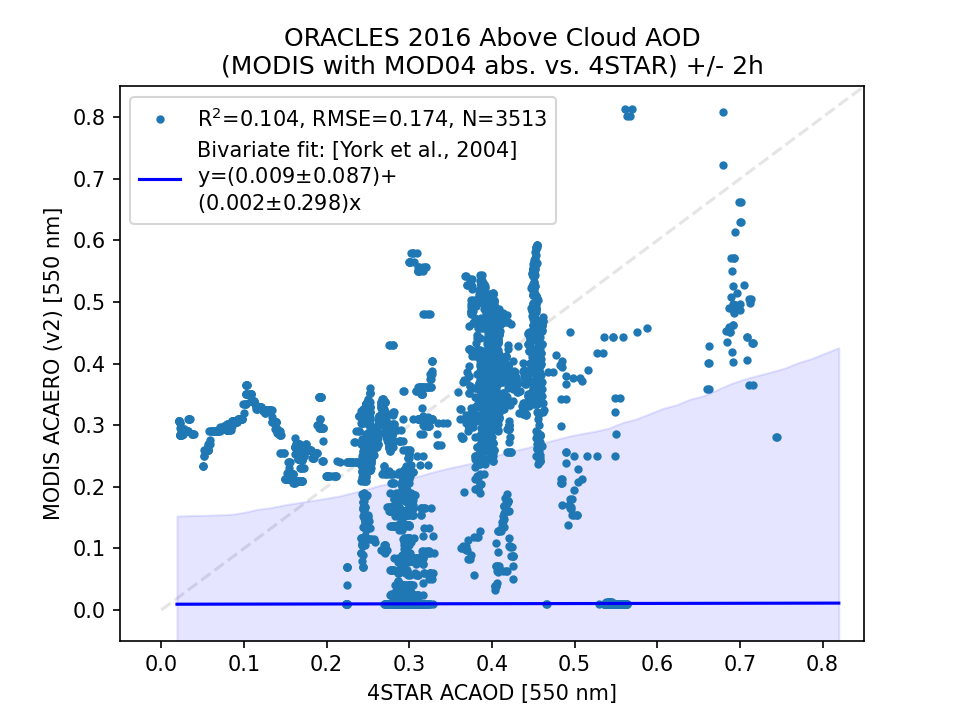

In [239]:
flo = (ar6['flag_acaod']==1) & ar6['fl'] & (ar6['mod_AAOD2']>-0.2) &\
       np.isfinite(ar6['mod_AAOD2']) & np.isfinite(ar6['AOD0550']) & (ar6['AOD0550']>0.02)

fig,ax = plt.subplots(1,1)
rbin = np.corrcoef(ar6['AOD0550'][flo],ar6['mod_AAOD2'][flo])[0,1]**2.0
rmse = np.sqrt(np.nanmean((ar6['AOD0550'][flo]-ar6['mod_AAOD2'][flo])**2.0))
num = len(ar6['mod_AAOD2'][flo])
plt.plot(ar6['AOD0550'][flo],ar6['mod_AAOD2'][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
#plt.errorbar(ar6['AOD0550'][flo],ar6['mod_AAOD2'][flo],xerr=ar6['UNCAOD0550'][flo],yerr=ar6['mod_AAOD_UNC'][flo],
#             marker='.',color='tab:blue',linestyle='None',alpha=0.2)
plt.xlabel('4STAR ACAOD [550 nm]')
plt.ylabel('MODIS ACAERO (v2) [550 nm]')
pu.plot_lin(ar6['AOD0550'][flo],ar6['mod_AAOD2'][flo],
            x_err=ar6['UNCAOD0550'][flo],y_err=ar6['mod_AAOD2_UNC'][flo],
            labels=True,shaded_ci=True,ci=95,ax=ax,
            use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with MOD04 abs. vs. 4STAR) +/- 2h')
plt.legend()
plt.xlim(-0.05,0.85)
plt.ylim(-0.05,0.85)
plt.savefig(fpo+'MODACAERO_v2_vs_4STAR_ORACLES2016_550nm.png',dpi=600,transparent=True)


In [ ]:
fig,ax = plt.subplots(1,1)
rbin = np.corrcoef(ar6['AOD0501'][flo],ar6['mod_AAOD'][flo])[0,1]**2.0
rmse = np.sqrt(np.nanmean((ar6['AOD0501'][flo]-ar6['mod_AAOD'][flo])**2.0))
num = len(ar6['mod_AAOD'][flo])
plt.plot(ar6['AOD0501'][flo],ar6['mod_AAOD'][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
plt.errorbar(ar6['AOD0501'][flo],ar6['mod_AAOD'][flo],xerr=ar6['UNCAOD0501'][flo],yerr=ar6['mod_AAOD_UNC'][flo]/100.0*ar6['mod_AAOD'][flo],
             marker='.',color='tab:blue',linestyle='None',alpha=0.2)
plt.xlabel('4STAR ACAOD [501 nm]')
plt.ylabel('MODIS ACAERO (v1) [550 nm]')
pu.plot_lin(ar6['AOD0501'][flo],ar6['mod_AAOD'][flo],
            x_err=ar6['UNCAOD0501'][flo],y_err=ar6['mod_AAOD_UNC'][flo]/100.0*ar6['mod_AAOD'][flo],
            labels=True,shaded_ci=True,ci=95,ax=ax,
            use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with 4STAR abs. vs. 4STAR) +/- 2h')
plt.legend()
plt.xlim(-0.05,0.85)
plt.ylim(-0.05,0.85)
plt.savefig(fpo+'MODACAERO_vs_4STAR_ORACLES2016_501nm.png',dpi=600,transparent=True)


<IPython.core.display.Javascript object>


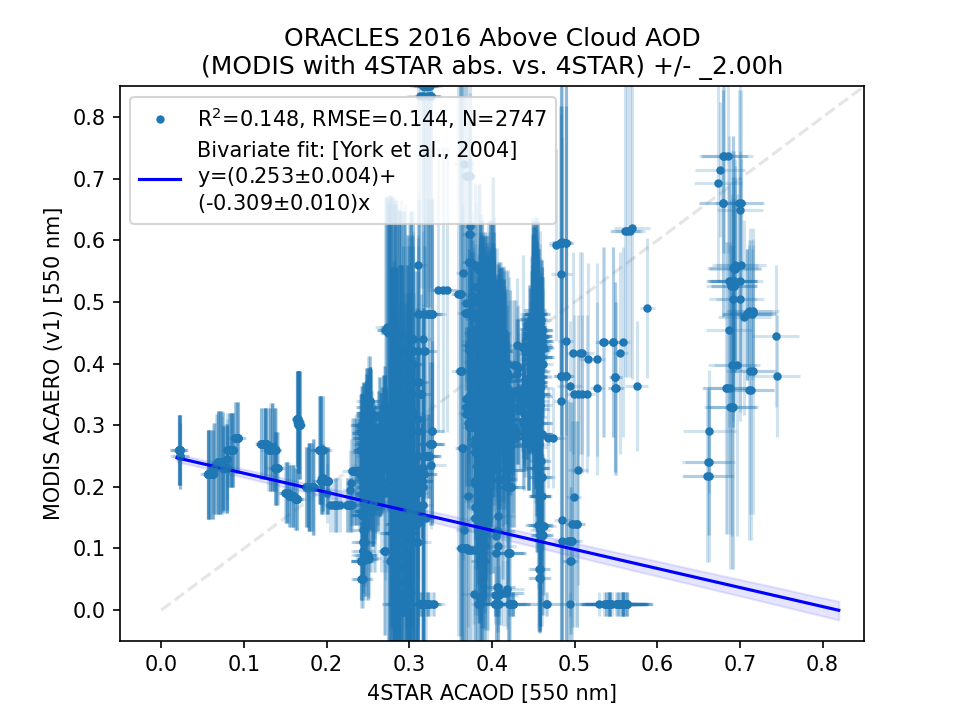

<IPython.core.display.Javascript object>


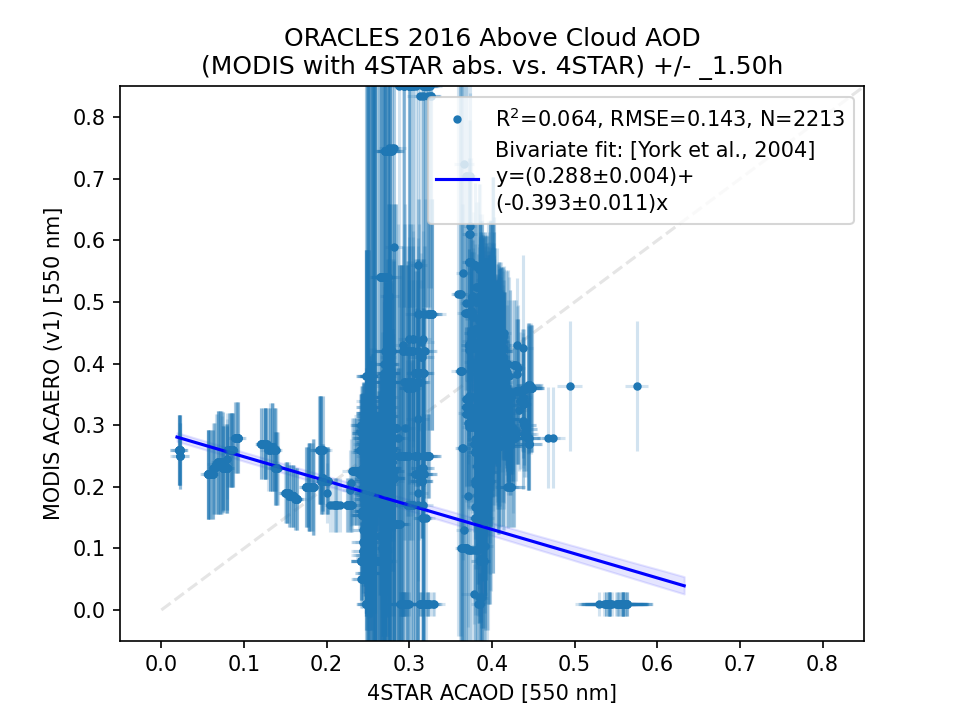

<IPython.core.display.Javascript object>


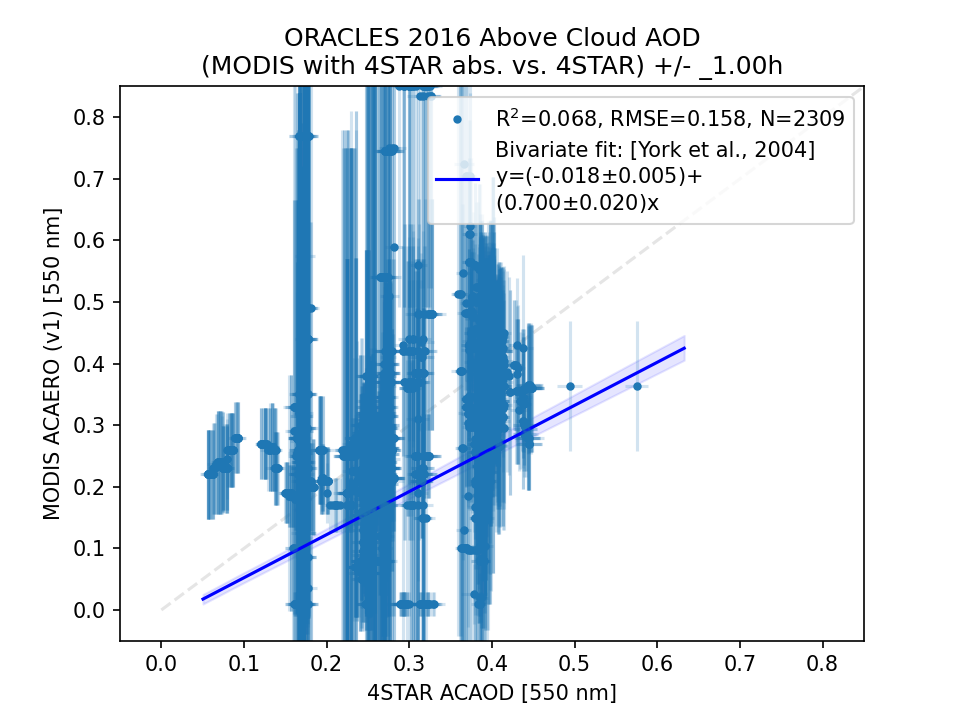

<IPython.core.display.Javascript object>


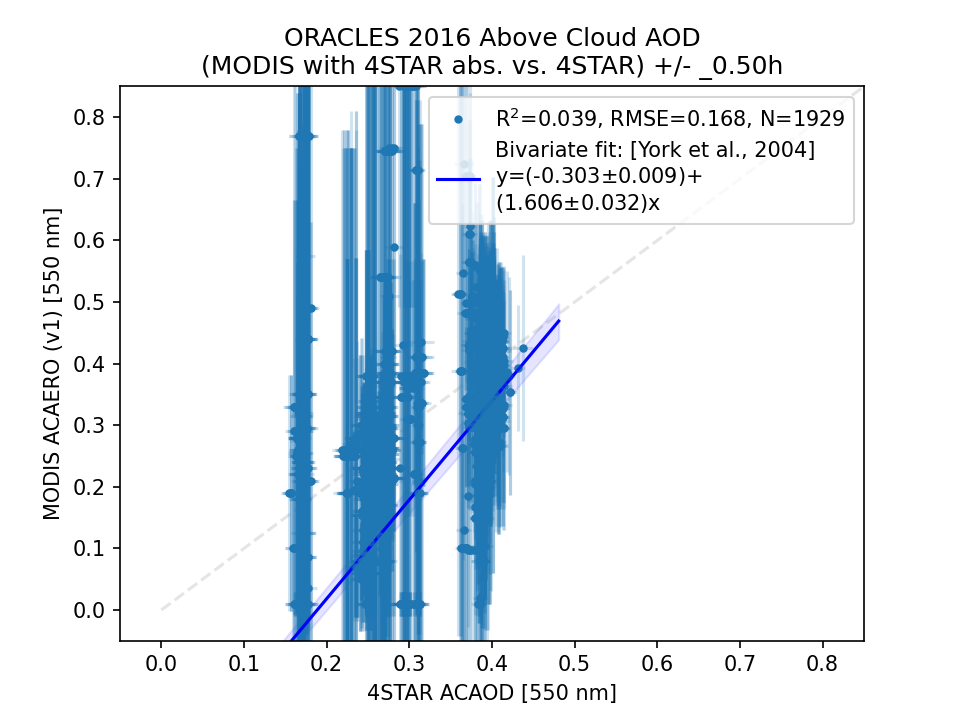

<IPython.core.display.Javascript object>


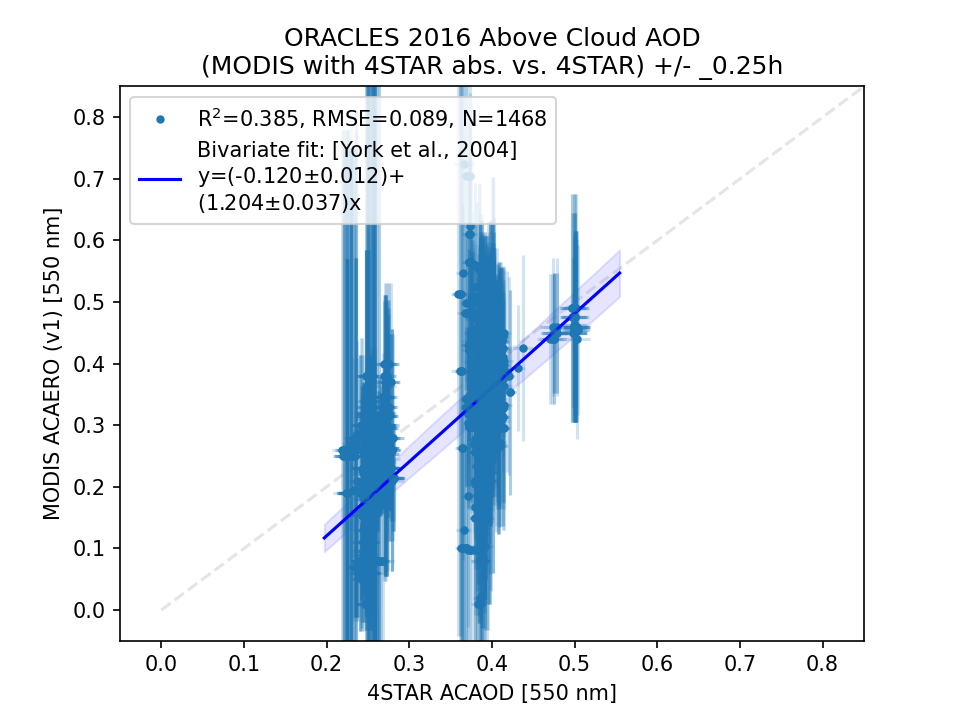

In [52]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    
    flo = (ar6['flag_acaod']==1) & ar6['fl'] & (ar6['mod_AAOD'+hstr]>-0.2) &\
       np.isfinite(ar6['mod_AAOD'+hstr]) & np.isfinite(ar6['AOD0550']) & (ar6['AOD0550']>0.02)

    fig,ax = plt.subplots(1,1)
    rbin = np.corrcoef(ar6['AOD0550'][flo],ar6['mod_AAOD'+hstr][flo])[0,1]**2.0
    rmse = np.sqrt(np.nanmean((ar6['AOD0550'][flo]-ar6['mod_AAOD'+hstr][flo])**2.0))
    num = len(ar6['mod_AAOD'+hstr][flo])
    plt.plot(ar6['AOD0550'][flo],ar6['mod_AAOD'+hstr][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
    plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
    plt.errorbar(ar6['AOD0550'][flo],ar6['mod_AAOD'+hstr][flo],xerr=ar6['UNCAOD0550'][flo],yerr=ar6['mod_AAOD_UNC'+hstr][flo],
                 marker='.',color='tab:blue',linestyle='None',alpha=0.2)
    plt.xlabel('4STAR ACAOD [550 nm]')
    plt.ylabel('MODIS ACAERO (v1) [550 nm]')
    pu.plot_lin(ar6['AOD0550'][flo],ar6['mod_AAOD'+hstr][flo],
                x_err=ar6['UNCAOD0550'][flo],y_err=ar6['mod_AAOD_UNC'+hstr][flo],
                labels=True,shaded_ci=True,ci=95,ax=ax,
                use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
    plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with 4STAR abs. vs. 4STAR) +/- '+hstr)
    plt.legend()
    plt.xlim(-0.05,0.85)
    plt.ylim(-0.05,0.85)
    plt.savefig(fpo+'MODACAERO_vs_4STAR_ORACLES2016_550nm'+hstr+'.png',dpi=600,transparent=True)


<IPython.core.display.Javascript object>


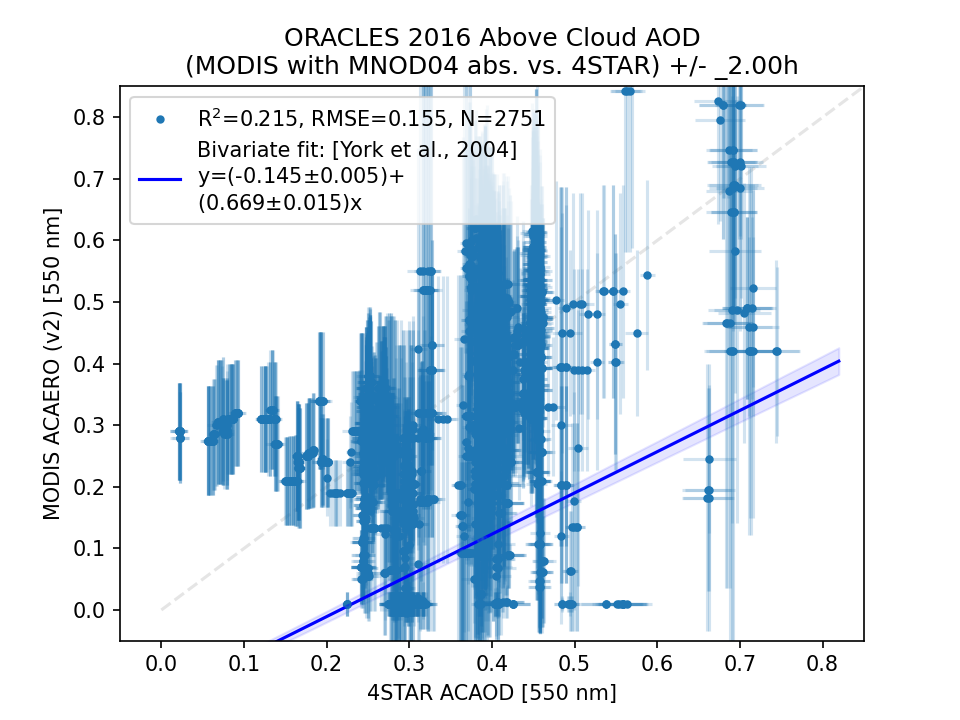

<IPython.core.display.Javascript object>


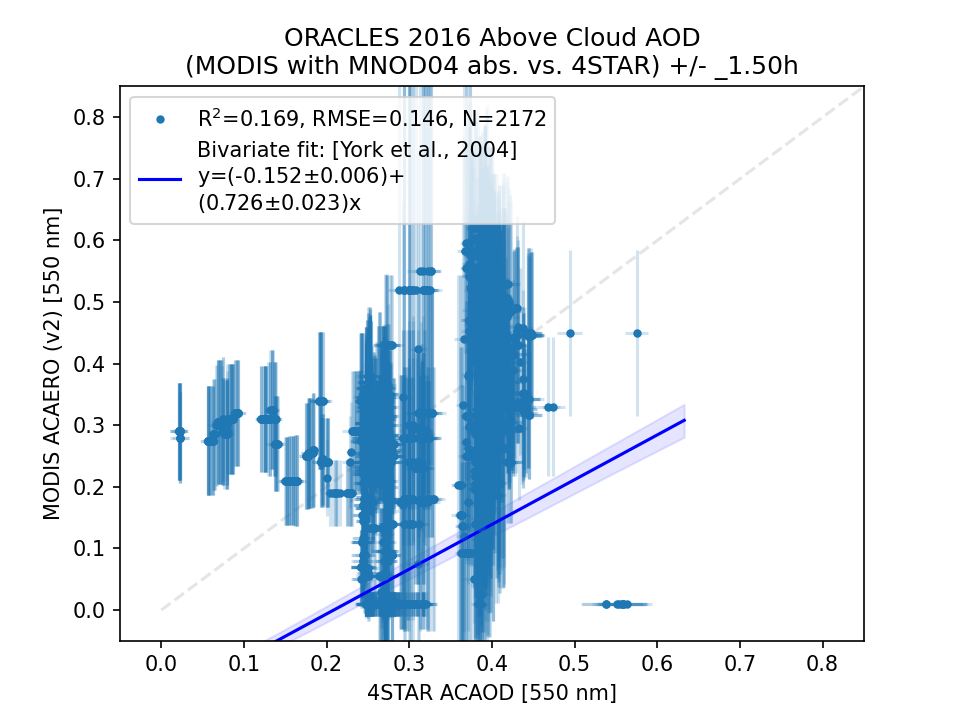

<IPython.core.display.Javascript object>


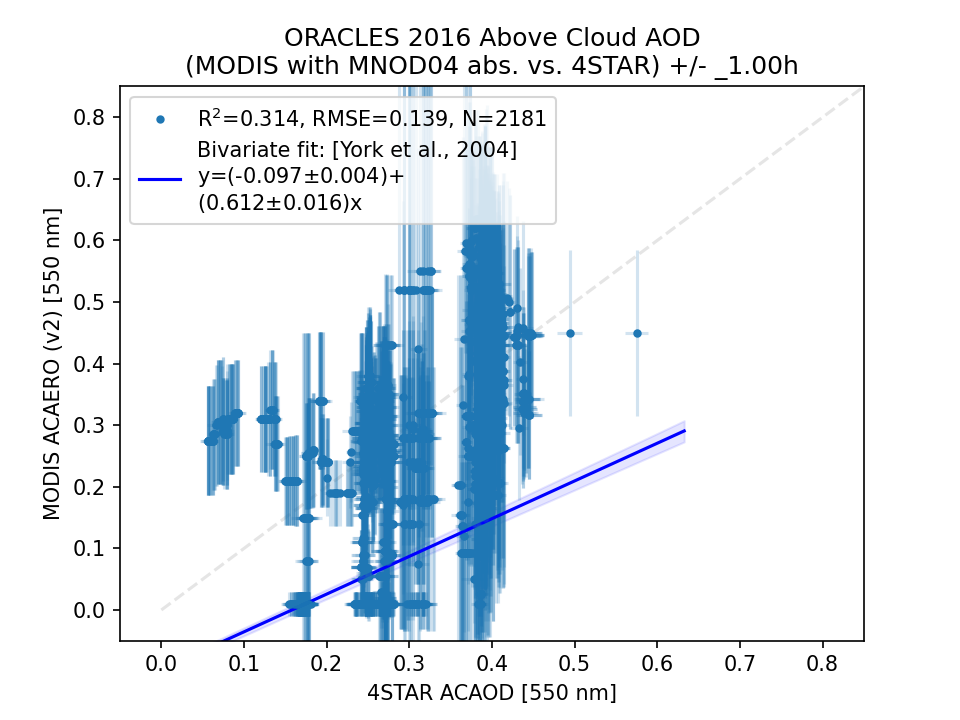

<IPython.core.display.Javascript object>


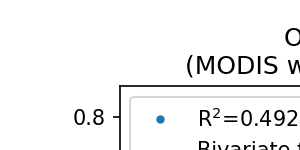

<IPython.core.display.Javascript object>


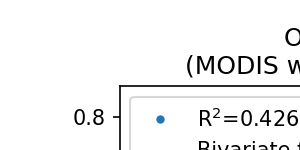

In [54]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    
    flo = (ar6['flag_acaod']==1) & ar6['fl'] & (ar6['mod_AAOD2'+hstr]>-0.2) &\
       np.isfinite(ar6['mod_AAOD2'+hstr]) & np.isfinite(ar6['AOD0550']) & (ar6['AOD0550']>0.02) & (ar6['mod_AAOD2_UNC'+hstr]>0.0)

    fig,ax = plt.subplots(1,1)
    rbin = np.corrcoef(ar6['AOD0550'][flo],ar6['mod_AAOD2'+hstr][flo])[0,1]**2.0
    rmse = np.sqrt(np.nanmean((ar6['AOD0550'][flo]-ar6['mod_AAOD2'+hstr][flo])**2.0))
    num = len(ar6['mod_AAOD2'+hstr][flo])
    plt.plot(ar6['AOD0550'][flo],ar6['mod_AAOD2'+hstr][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
    plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
    plt.errorbar(ar6['AOD0550'][flo],ar6['mod_AAOD2'+hstr][flo],xerr=ar6['UNCAOD0550'][flo],yerr=ar6['mod_AAOD2_UNC'+hstr][flo],
                 marker='.',color='tab:blue',linestyle='None',alpha=0.2)
    plt.xlabel('4STAR ACAOD [550 nm]')
    plt.ylabel('MODIS ACAERO (v2) [550 nm]')
    pu.plot_lin(ar6['AOD0550'][flo],ar6['mod_AAOD2'+hstr][flo],
                x_err=ar6['UNCAOD0550'][flo],y_err=ar6['mod_AAOD2_UNC'+hstr][flo],
                labels=True,shaded_ci=True,ci=95,ax=ax,
                use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
    plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with MOD04 abs. vs. 4STAR) +/- '+hstr)
    plt.legend()
    plt.xlim(-0.05,0.85)
    plt.ylim(-0.05,0.85)
    plt.savefig(fpo+'MODACAEROv2_vs_4STAR_ORACLES2016_550nm'+hstr+'.png',dpi=600,transparent=True)


### HSRL

<IPython.core.display.Javascript object>


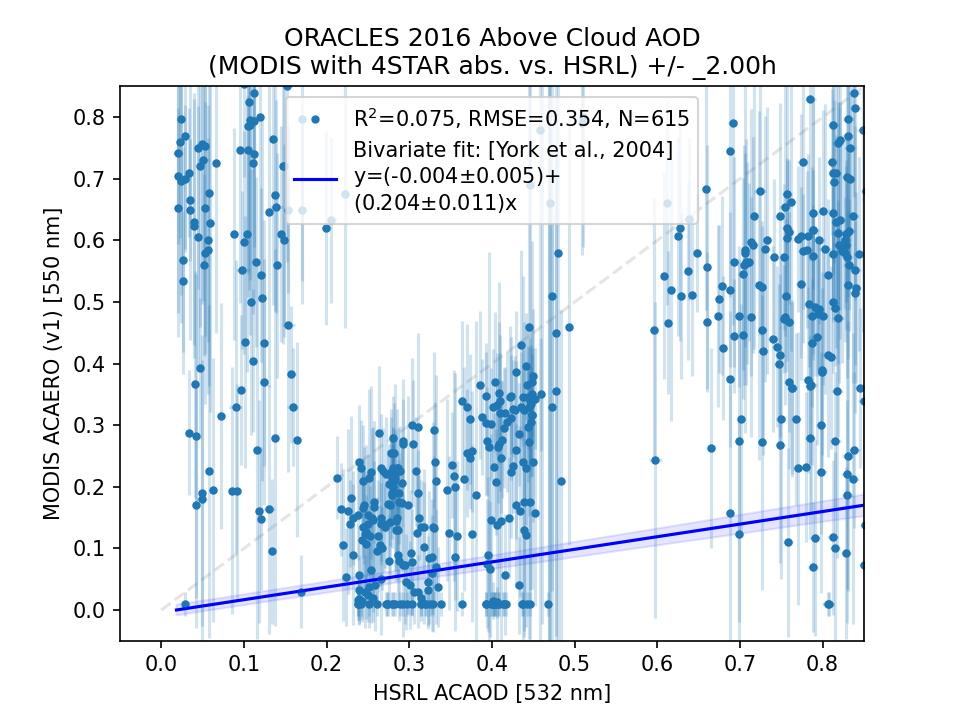

<IPython.core.display.Javascript object>


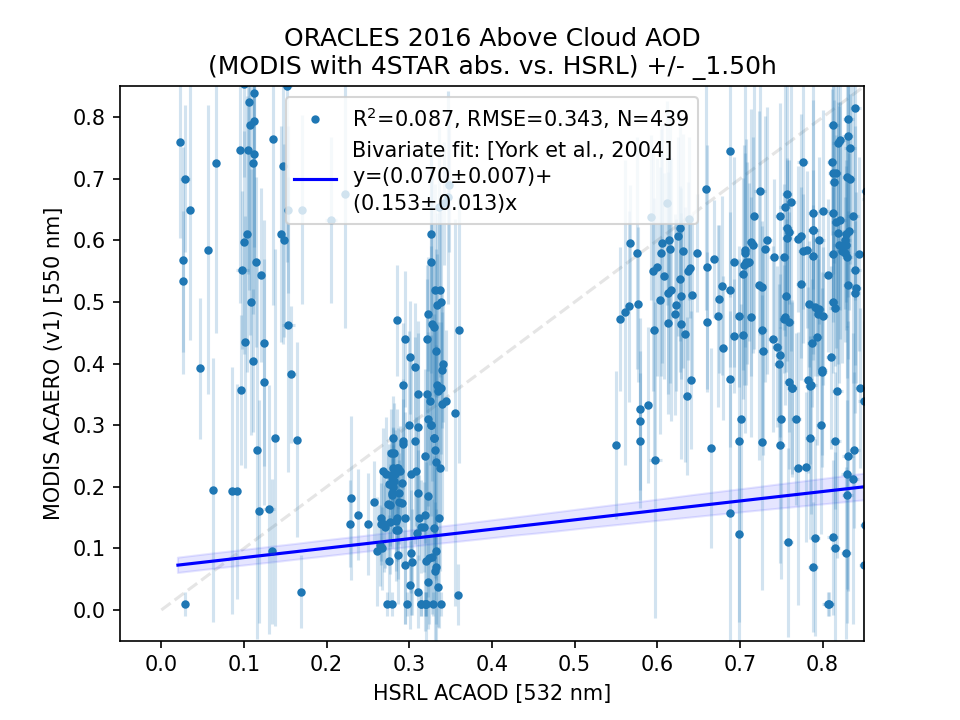

<IPython.core.display.Javascript object>


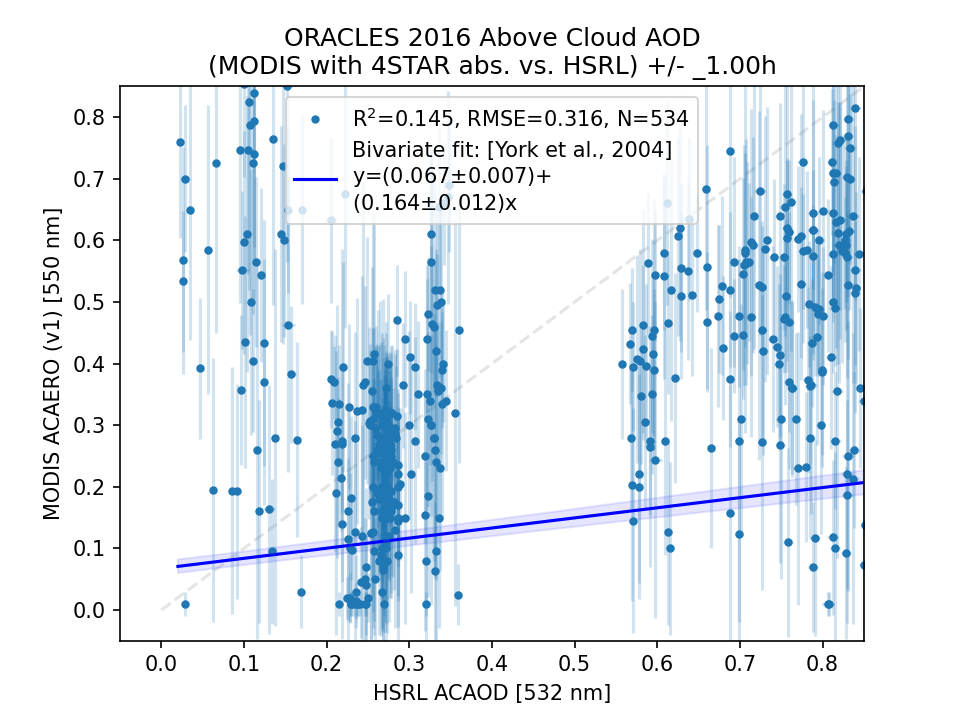

<IPython.core.display.Javascript object>


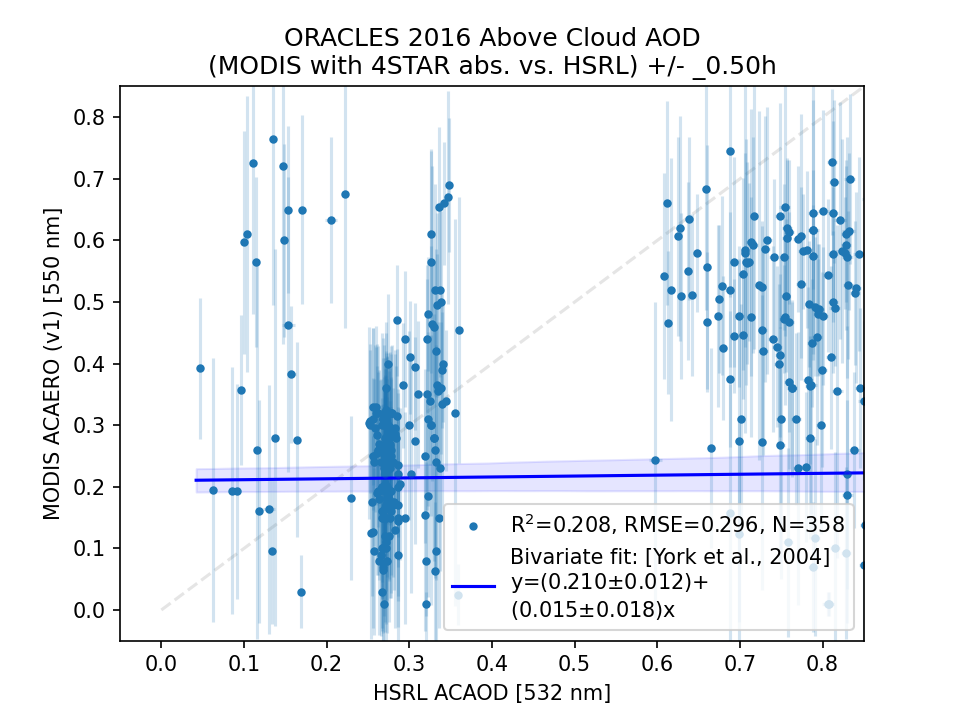

<IPython.core.display.Javascript object>


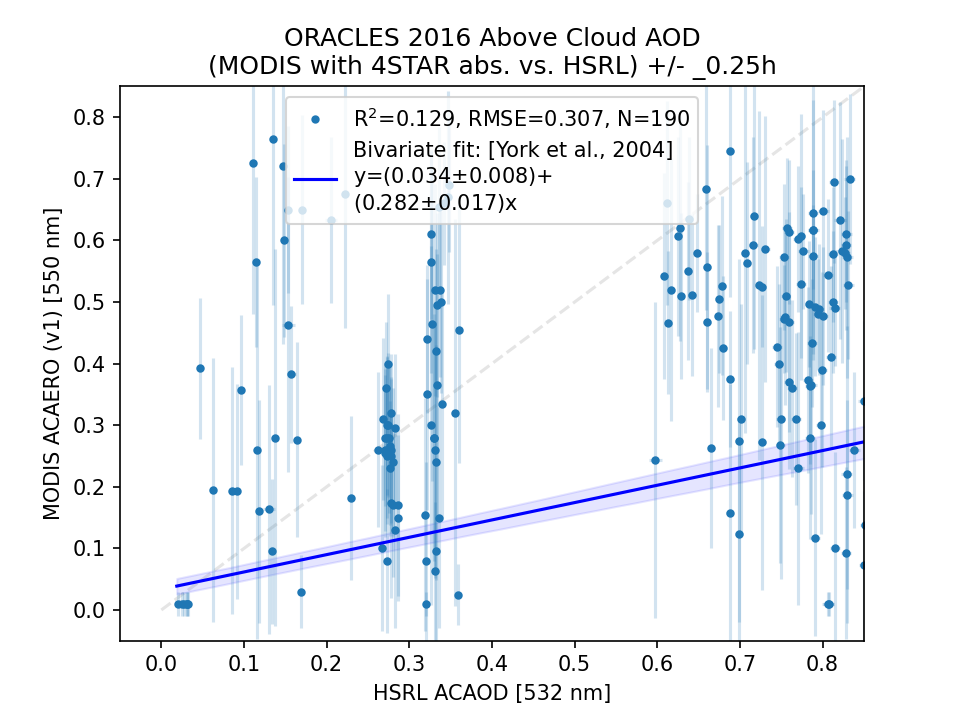

In [61]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    
    flo = (hr6['mod_AAOD'+hstr]>-0.2) & (hr6['mod_AAOD_UNC'+hstr] > 0.0) &\
       np.isfinite(hr6['mod_AAOD'+hstr]) & np.isfinite(hr6['acaod_532']) & (hr6['acaod_532']>0.02)

    fig,ax = plt.subplots(1,1)
    rbin = np.corrcoef(hr6['acaod_532'][flo],hr6['mod_AAOD'+hstr][flo])[0,1]**2.0
    rmse = np.sqrt(np.nanmean((hr6['acaod_532'][flo]-hr6['mod_AAOD'+hstr][flo])**2.0))
    num = len(hr6['mod_AAOD'+hstr][flo])
    plt.plot(hr6['acaod_532'][flo],hr6['mod_AAOD'+hstr][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
    plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
    plt.errorbar(hr6['acaod_532'][flo],hr6['mod_AAOD'+hstr][flo],xerr=hr6['acaod_532_unc'][flo],yerr=hr6['mod_AAOD_UNC'+hstr][flo],
                 marker='.',color='tab:blue',linestyle='None',alpha=0.2)
    plt.xlabel('HSRL ACAOD [532 nm]')
    plt.ylabel('MODIS ACAERO (v1) [550 nm]')
    pu.plot_lin(hr6['acaod_532'][flo],hr6['mod_AAOD'+hstr][flo],
                x_err=hr6['acaod_532_unc'][flo],y_err=hr6['mod_AAOD_UNC'+hstr][flo],
                labels=True,shaded_ci=True,ci=95,ax=ax,
                use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
    plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with 4STAR abs. vs. HSRL) +/- '+hstr)
    plt.legend()
    plt.xlim(-0.05,0.85)
    plt.ylim(-0.05,0.85)
    plt.savefig(fpo+'MODACAERO_vs_HSRL_ORACLES2016_532nm'+hstr+'.png',dpi=600,transparent=True)


<IPython.core.display.Javascript object>


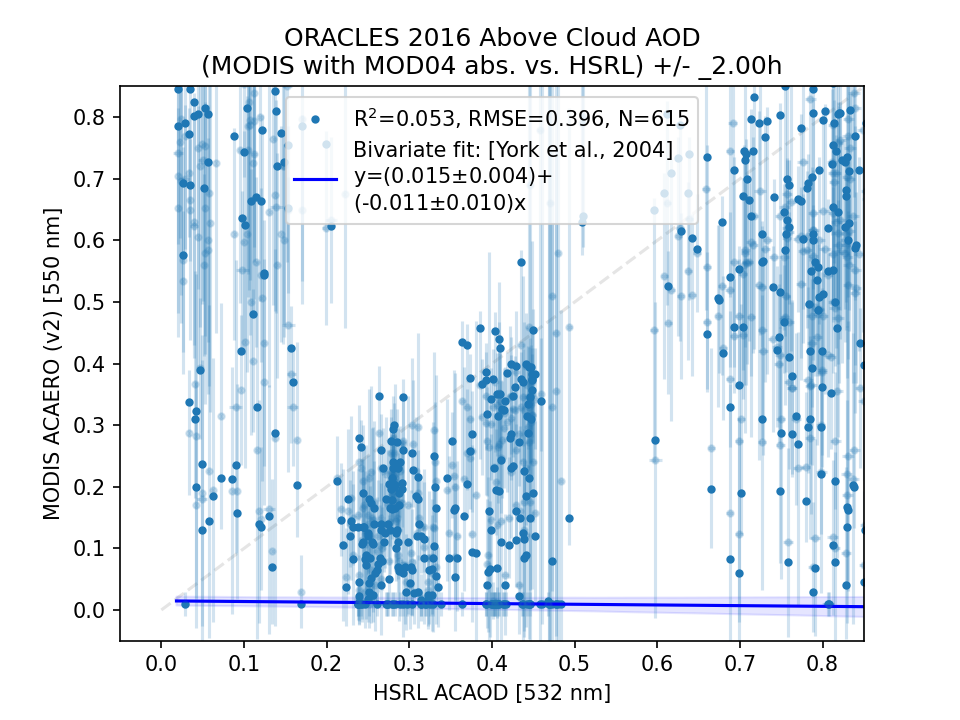

<IPython.core.display.Javascript object>


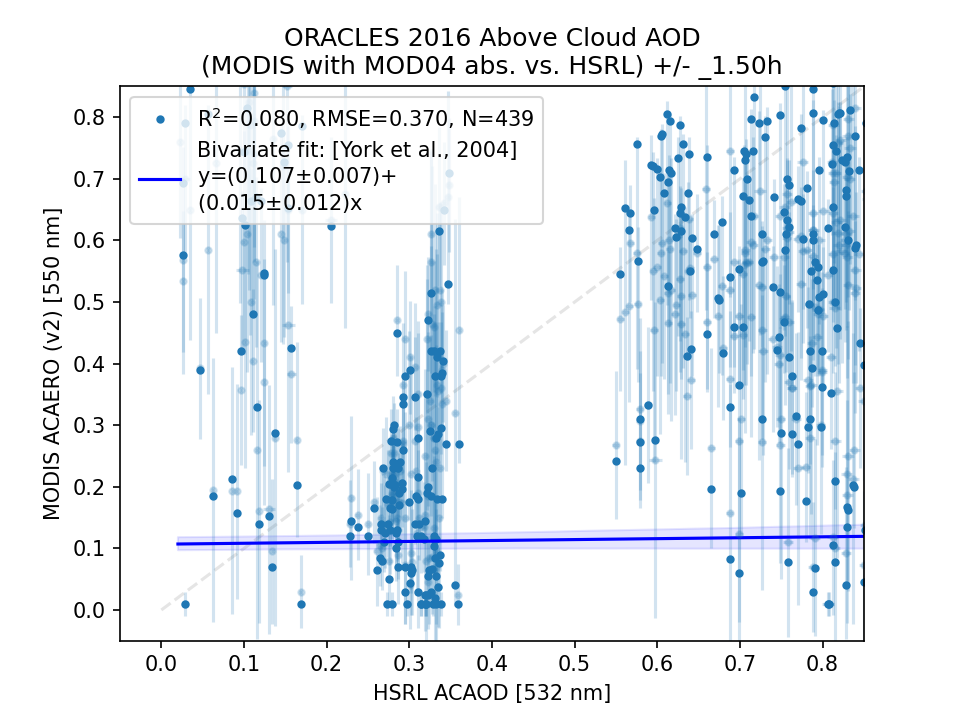

<IPython.core.display.Javascript object>


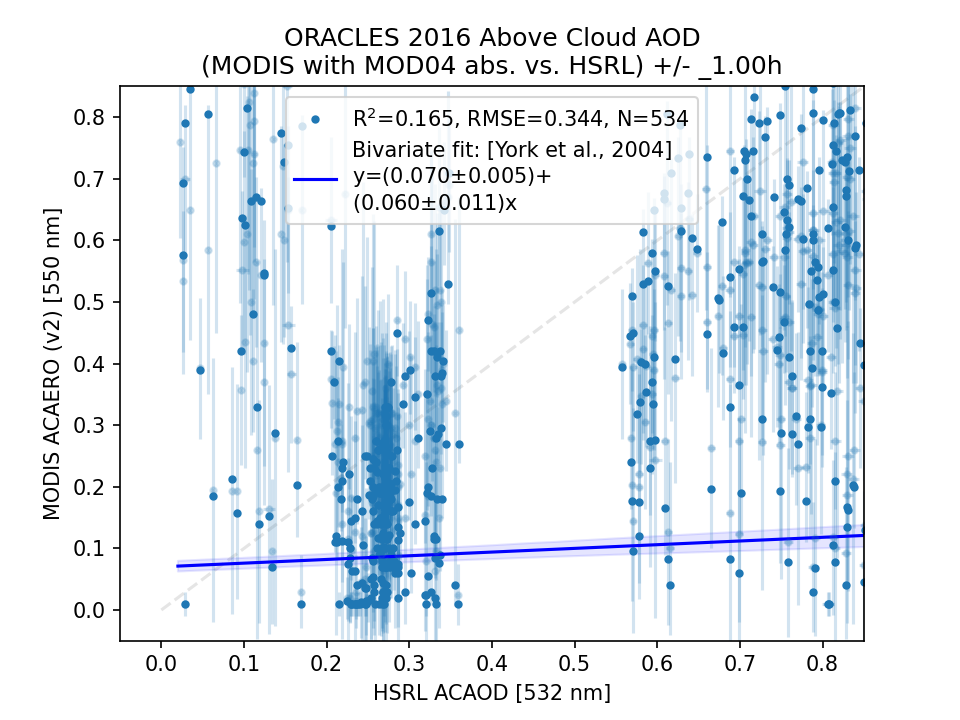

<IPython.core.display.Javascript object>


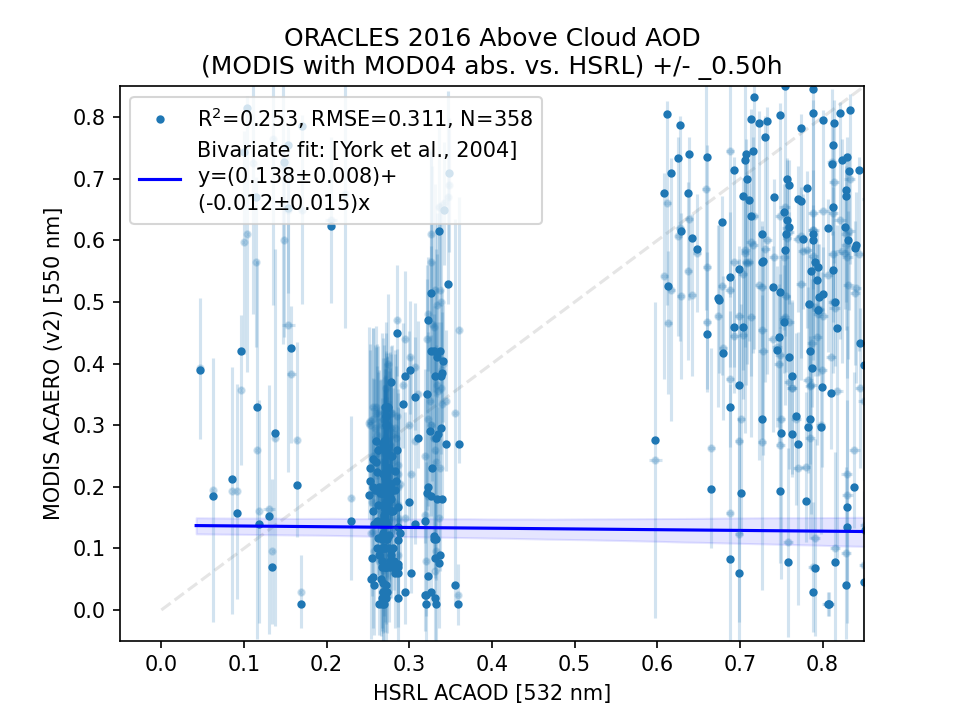

<IPython.core.display.Javascript object>


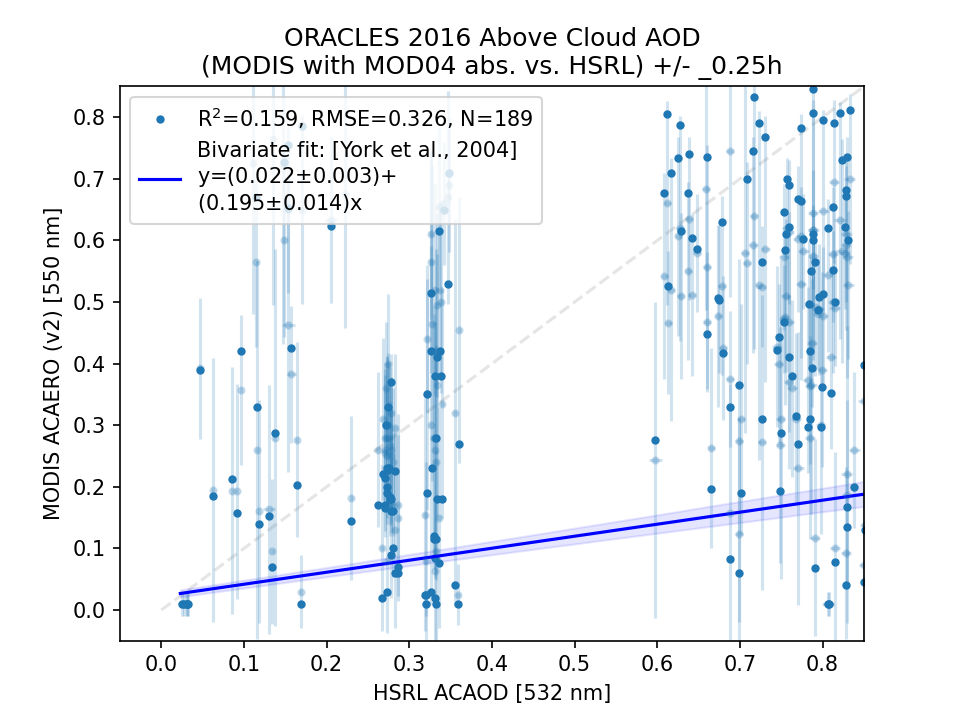

In [62]:
for to in [2.0,1.5,1.0,0.5,0.25]:
    hstr = '_{:1.2f}h'.format(to)
    
    flo = (hr6['mod_AAOD2'+hstr]>-0.2) & (hr6['mod_AAOD_UNC'+hstr]>0.0) &\
       np.isfinite(hr6['mod_AAOD2'+hstr]) & np.isfinite(hr6['acaod_532']) & (hr6['acaod_532']>0.02)

    fig,ax = plt.subplots(1,1)
    rbin = np.corrcoef(hr6['acaod_532'][flo],hr6['mod_AAOD2'+hstr][flo])[0,1]**2.0
    rmse = np.sqrt(np.nanmean((hr6['acaod_532'][flo]-hr6['mod_AAOD2'+hstr][flo])**2.0))
    num = len(hr6['mod_AAOD2'+hstr][flo])
    plt.plot(hr6['acaod_532'][flo],hr6['mod_AAOD2'+hstr][flo],'.',label='R$^2$={:1.3f}, RMSE={:1.3f}, N={:3.0f}'.format(rbin,rmse,num))
    plt.plot([0,1],[0,1],'--',alpha=0.2,color='grey',zorder=-2)
    plt.errorbar(hr6['acaod_532'][flo],hr6['mod_AAOD'+hstr][flo],xerr=hr6['acaod_532_unc'][flo],yerr=hr6['mod_AAOD_UNC'+hstr][flo],
                 marker='.',color='tab:blue',linestyle='None',alpha=0.2)
    plt.xlabel('HSRL ACAOD [532 nm]')
    plt.ylabel('MODIS ACAERO (v2) [550 nm]')
    pu.plot_lin(hr6['acaod_532'][flo],hr6['mod_AAOD2'+hstr][flo],
                x_err=hr6['acaod_532_unc'][flo],y_err=hr6['mod_AAOD2_UNC'+hstr][flo],
                labels=True,shaded_ci=True,ci=95,ax=ax,
                use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
    plt.title('ORACLES 2016 Above Cloud AOD\n(MODIS with MOD04 abs. vs. HSRL) +/- '+hstr)
    plt.legend()
    plt.xlim(-0.05,0.85)
    plt.ylim(-0.05,0.85)
    plt.savefig(fpo+'MODACAEROv2_vs_HSRL_ORACLES2016_532nm'+hstr+'.png',dpi=600,transparent=True)
